# 2.2 Feature Engineering and Transformations

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# Importing the dataset from parquet file
df = pd.read_parquet('df_clean.parquet')

df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Day_Number
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01,2.55,17850,United Kingdom,1
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01,3.39,17850,United Kingdom,1
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01,2.75,17850,United Kingdom,1
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01,3.39,17850,United Kingdom,1
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01,3.39,17850,United Kingdom,1


In [2]:
# export the data to csv in case you want it in csv format
df.to_csv('df_clean.csv', index=False) 

Add on 'TotalSales' in baseline df to calculate the amount spent on each line item of StockCode:

In [3]:
# create new column 'TotalSales' by multiplying 'Quantity' and 'UnitPrice'
df['TotalSales'] = df['Quantity'] * df['UnitPrice']

df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Day_Number,TotalSales
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01,2.55,17850,United Kingdom,1,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01,3.39,17850,United Kingdom,1,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01,2.75,17850,United Kingdom,1,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01,3.39,17850,United Kingdom,1,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01,3.39,17850,United Kingdom,1,20.34


Visualizations: Removal of outliers below 1 and 99% for more meaningful visualization in PPT:

In [4]:
def visualize_numeric_features(df):
    """Visualize numeric features in the DataFrame"""
    # Identify numeric columns
    numeric_cols = df.select_dtypes(include=['int64', 'float64', 'int32']).columns.tolist()
    
    # Calculate the number of rows needed (3 plots per row)
    n_cols = 3
    n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
    
    plt.figure(figsize=(20, 5 * n_rows))
    
    for i, col in enumerate(numeric_cols):
        plt.subplot(n_rows, n_cols, i + 1)
        
        # Remove extreme outliers for better visualization (1% to 99% range)
        value_filter = df[col].between(df[col].quantile(0.01), df[col].quantile(0.99))
        
        # Create histogram with KDE
        sns.histplot(df.loc[value_filter, col], kde=True)
        
        # Add descriptive statistics as text
        stats_text = (
            f"Mean: {df[col].mean():.2f}\n"
            f"Median: {df[col].median():.2f}\n"
            f"Std: {df[col].std():.2f}\n"
            f"Skew: {df[col].skew():.2f}"
        )
        plt.text(0.95, 0.95, stats_text, transform=plt.gca().transAxes, 
                 ha='right', va='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        plt.title(f'Distribution of {col}')
        plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def visualize_categorical_features(df):
    """Visualize categorical features in the DataFrame"""
    # Identify categorical columns
    cat_cols = df.select_dtypes(include=['object']).columns.tolist()
    
    # Visualize each categorical feature
    for col in cat_cols:
        # Get value counts and calculate the number to display
        val_counts = df[col].value_counts().sort_values(ascending=False)
        
        # Determine max categories to show based on distribution
        if len(val_counts) <= 20:
            # Show all categories if 20 or fewer
            cats_to_show = len(val_counts)
        else:
            # Show top 15 categories if more than 20
            cats_to_show = 15
            
        # Create figure
        plt.figure(figsize=(12, 8))
        
        # Plot top categories
        top_counts = val_counts.head(cats_to_show)
        
        # Use horizontal bar chart for better readability
        bars = plt.barh(top_counts.index, top_counts.values)
        
        # Add percentage labels
        total = len(df)
        for i, v in enumerate(top_counts.values):
            pct = v / total * 100
            plt.text(v + 0.1, i, f"{v} ({pct:.1f}%)", va='center')
        
        # Add note about remaining categories if truncated
        if len(val_counts) > cats_to_show:
            remaining_count = val_counts.iloc[cats_to_show:].sum()
            remaining_pct = remaining_count / total * 100
            plt.annotate(f"... and {len(val_counts) - cats_to_show} more categories "
                         f"({remaining_count} records, {remaining_pct:.1f}%)",
                         xy=(0.5, -0.08), xycoords='axes fraction', ha='center')
        
        plt.title(f'Top Categories for {col}')
        plt.xlabel('Count')
        plt.grid(axis='x', alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        # For columns with many categories, also show a pie chart of top 5
        if len(val_counts) > 10:
            plt.figure(figsize=(12, 8))
            
            # Get top 5 categories and group others
            top5 = val_counts.head(5)
            others = pd.Series({'Others': val_counts.iloc[5:].sum()})
            pie_data = pd.concat([top5, others])
            
            # Create pie chart
            plt.pie(pie_data, labels=pie_data.index, autopct='%1.1f%%', 
                   startangle=90, explode=[0.05]*5 + [0.1])
            plt.title(f'Top 5 Categories for {col}')
            plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
            plt.tight_layout()
            plt.show()

def visualize_datetime_features(df):
    """Visualize datetime features in the DataFrame"""
    # Identify datetime columns
    date_cols = df.select_dtypes(include=['datetime64']).columns.tolist()
    
    for col in date_cols:
        # Create a copy to avoid modifying original DataFrame
        df_temp = df.copy()
        
        # Create 3 visualizations for each datetime column
        fig, axes = plt.subplots(3, 1, figsize=(15, 18))
        
        # 1. Transaction count by month
        df_temp['Month'] = df_temp[col].dt.to_period('M')
        monthly_counts = df_temp.groupby('Month').size()
        
        monthly_counts.index = monthly_counts.index.astype(str)
        axes[0].bar(monthly_counts.index, monthly_counts.values)
        axes[0].set_title(f'Transaction Count by Month')
        axes[0].set_xticklabels(monthly_counts.index, rotation=45)
        axes[0].grid(axis='y', alpha=0.3)
        
        # 2. Transaction count by day of week
        df_temp['DayOfWeek'] = df_temp[col].dt.day_name()
        day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        day_counts = df_temp['DayOfWeek'].value_counts().reindex(day_order)
        
        axes[1].bar(day_counts.index, day_counts.values)
        axes[1].set_title(f'Transaction Count by Day of Week')
        axes[1].set_xticklabels(day_counts.index, rotation=45)
        axes[1].grid(axis='y', alpha=0.3)
        
        # 3. Transaction count by hour
        df_temp['Hour'] = df_temp[col].dt.hour
        hour_counts = df_temp['Hour'].value_counts().sort_index()
        
        axes[2].bar(hour_counts.index, hour_counts.values)
        axes[2].set_title(f'Transaction Count by Hour of Day')
        axes[2].set_xticks(range(0, 24))
        axes[2].grid(axis='y', alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # Sales trends over time
        plt.figure(figsize=(16, 6))
        
        # Daily sales time series
        if 'TotalSales' in df.columns:
            daily_sales = df.groupby(df[col].dt.date)['TotalSales'].sum()
            
            plt.plot(daily_sales.index, daily_sales.values, marker='o', linestyle='-', alpha=0.6)
            plt.title(f'Daily Sales Trends')
            plt.xlabel('Date')
            plt.ylabel('Total Sales')
            plt.grid(alpha=0.3)
            plt.xticks(rotation=45)
            
            plt.tight_layout()
            plt.show()


Visualizing Numeric Features...


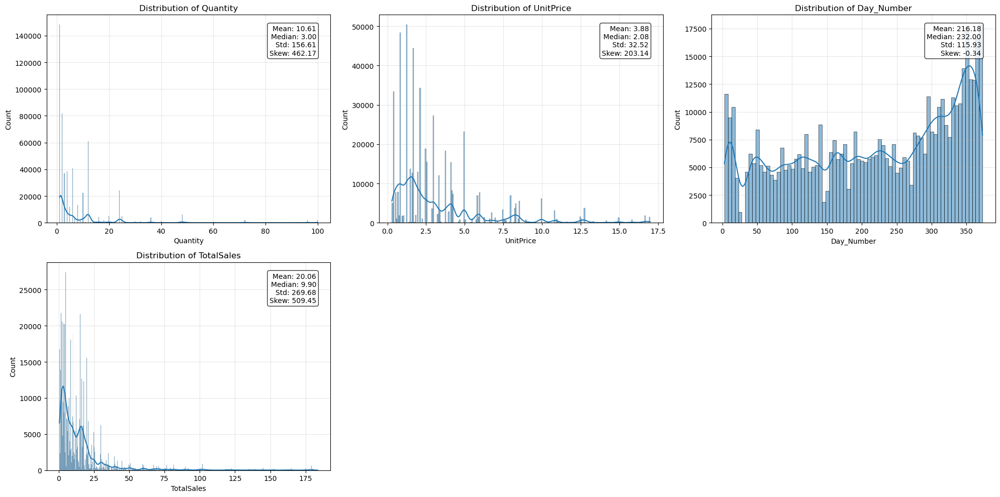

Visualizing Categorical Features...


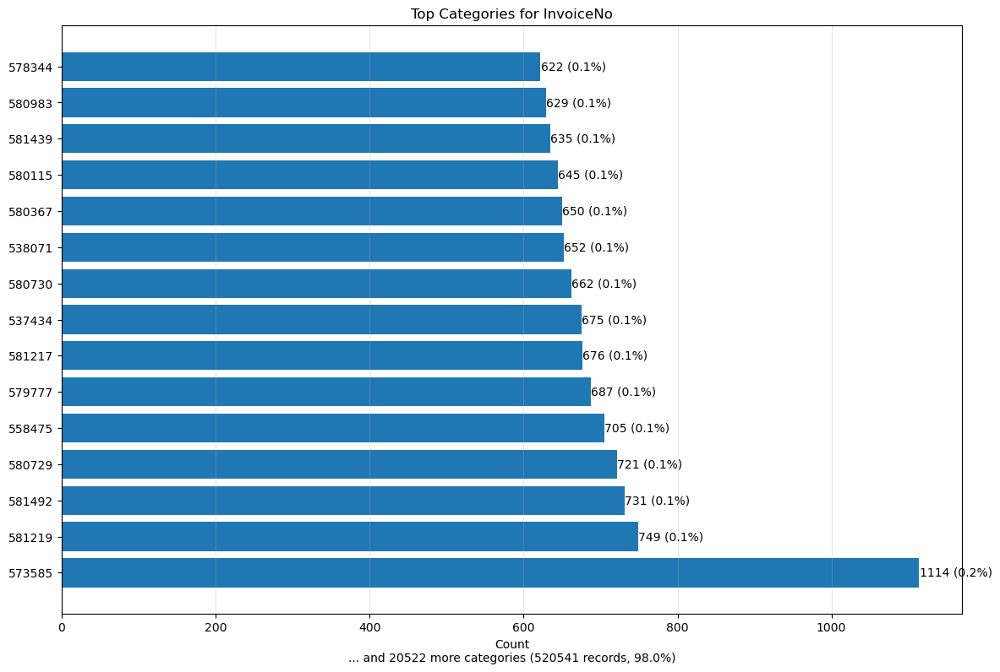

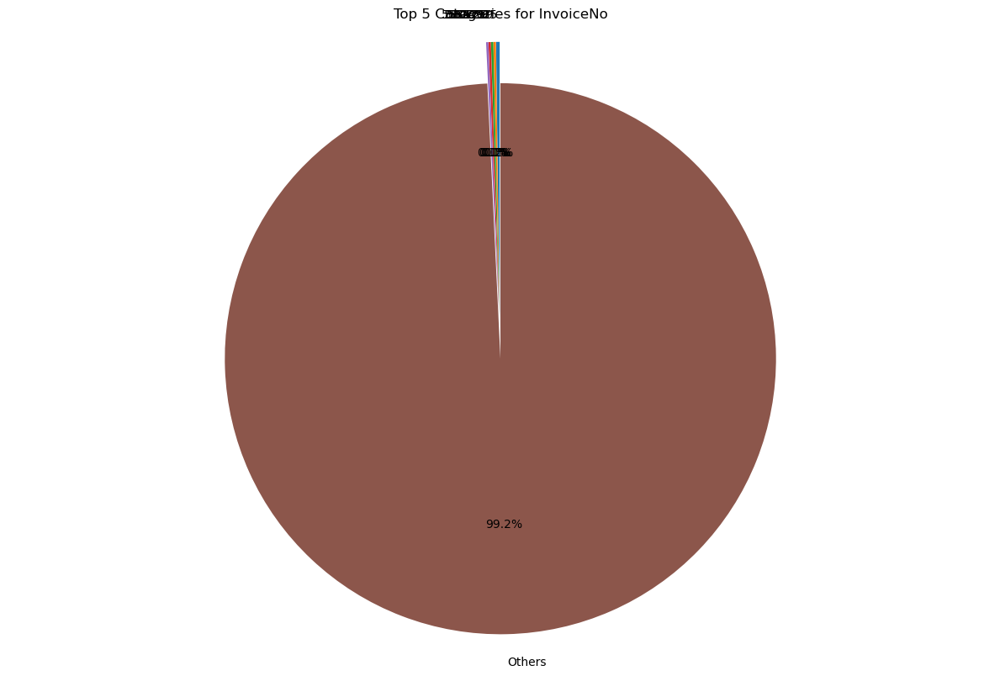

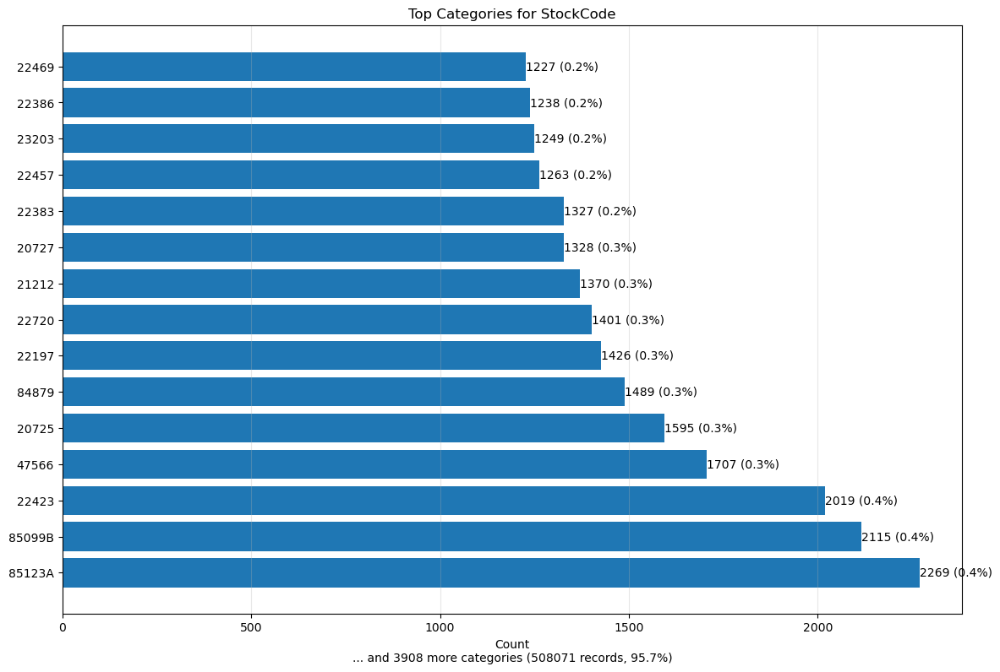

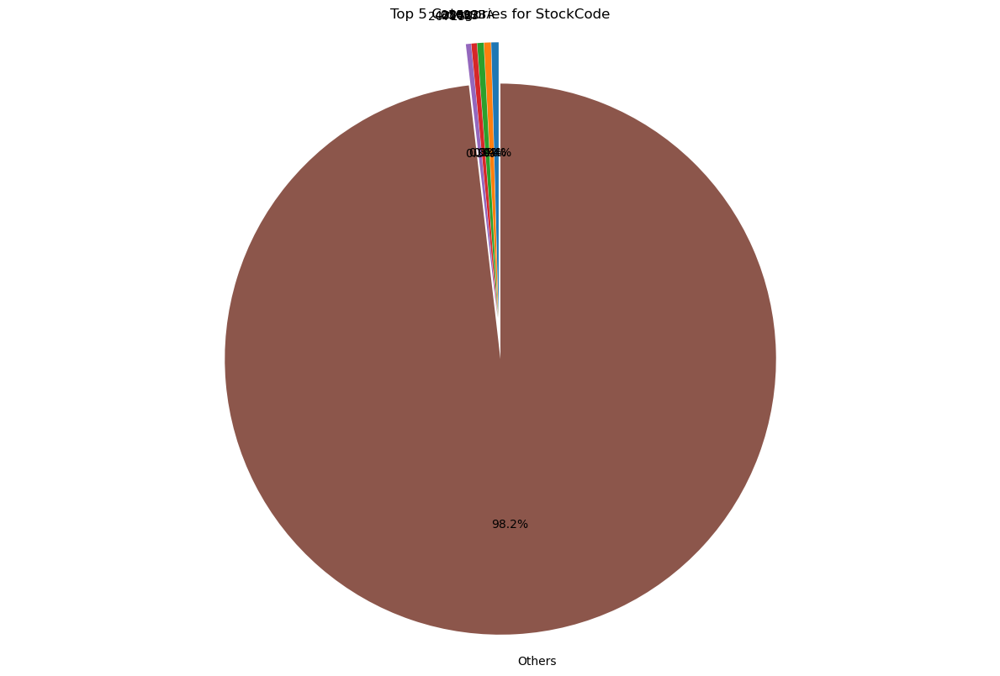

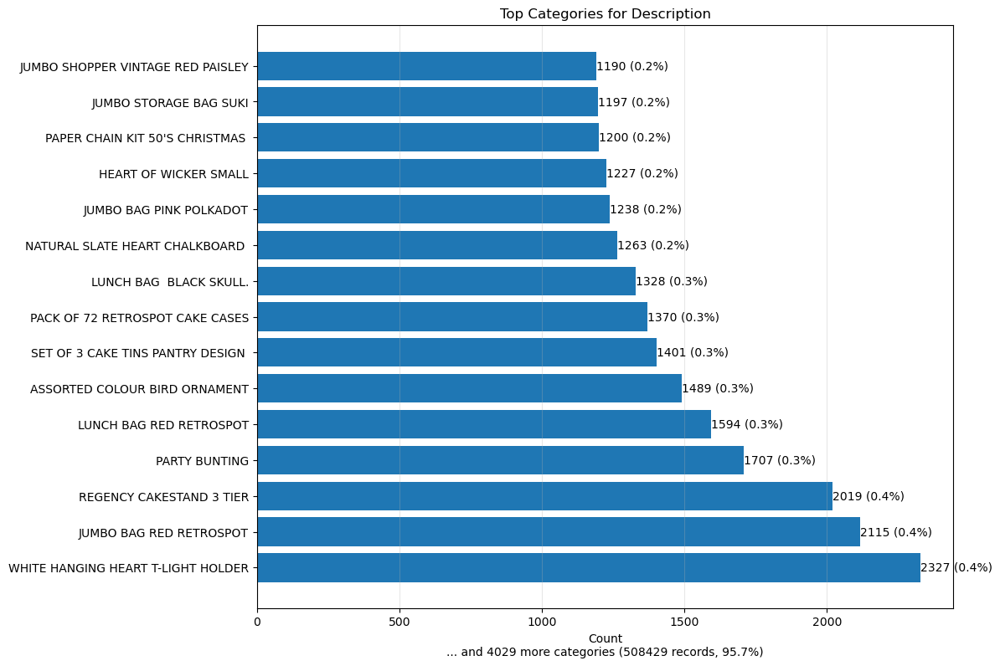

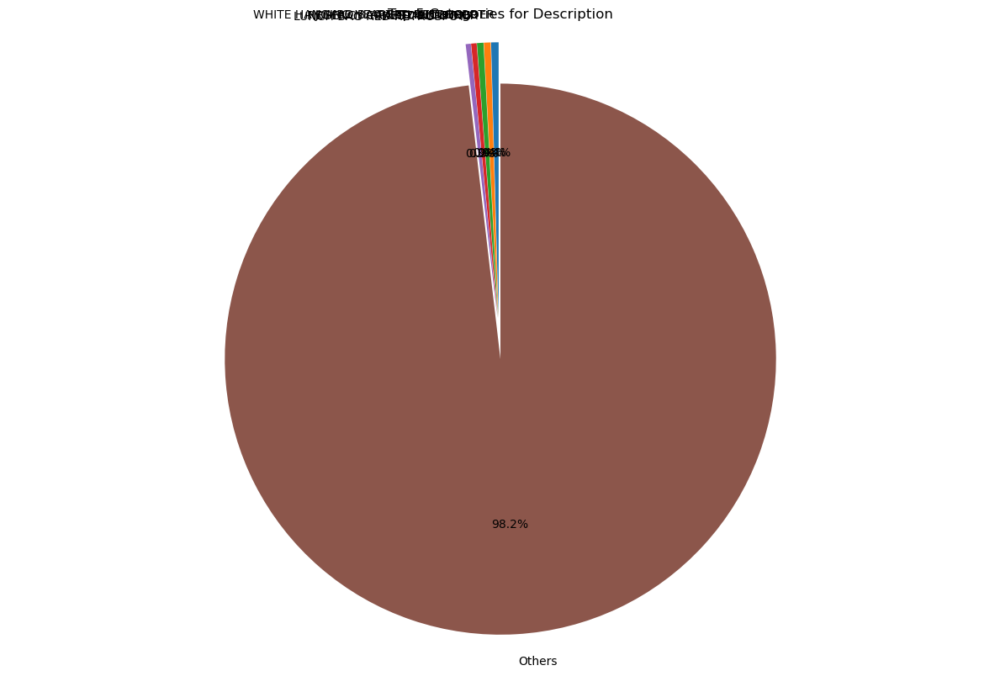

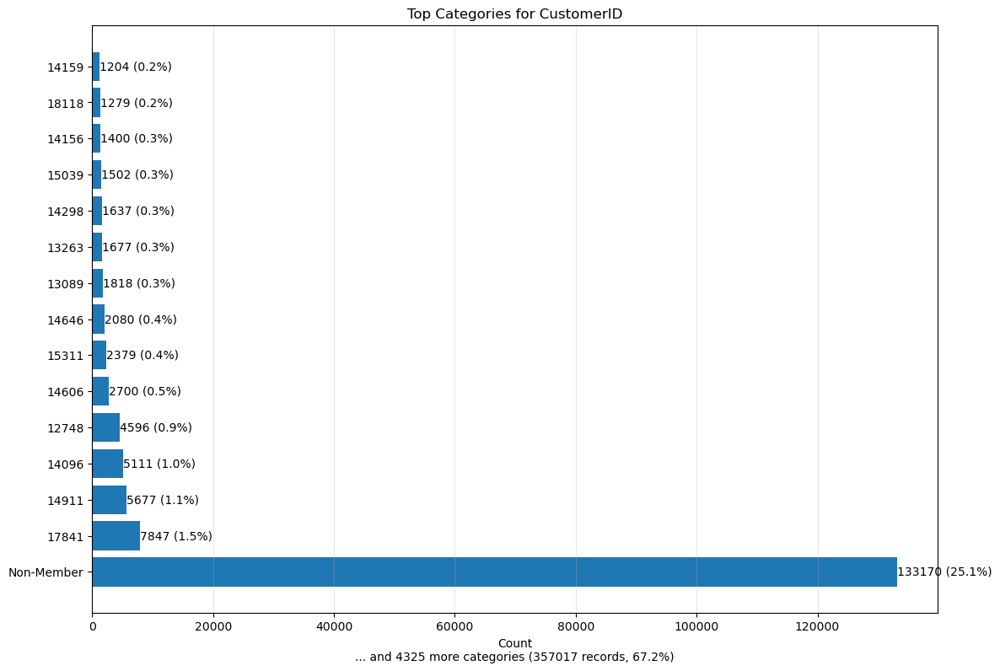

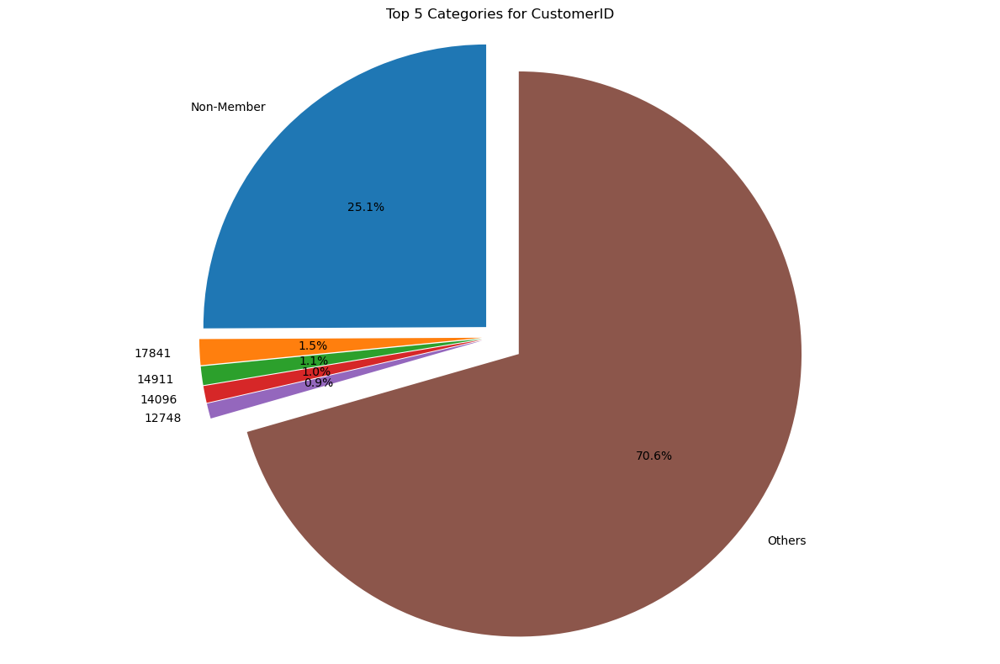

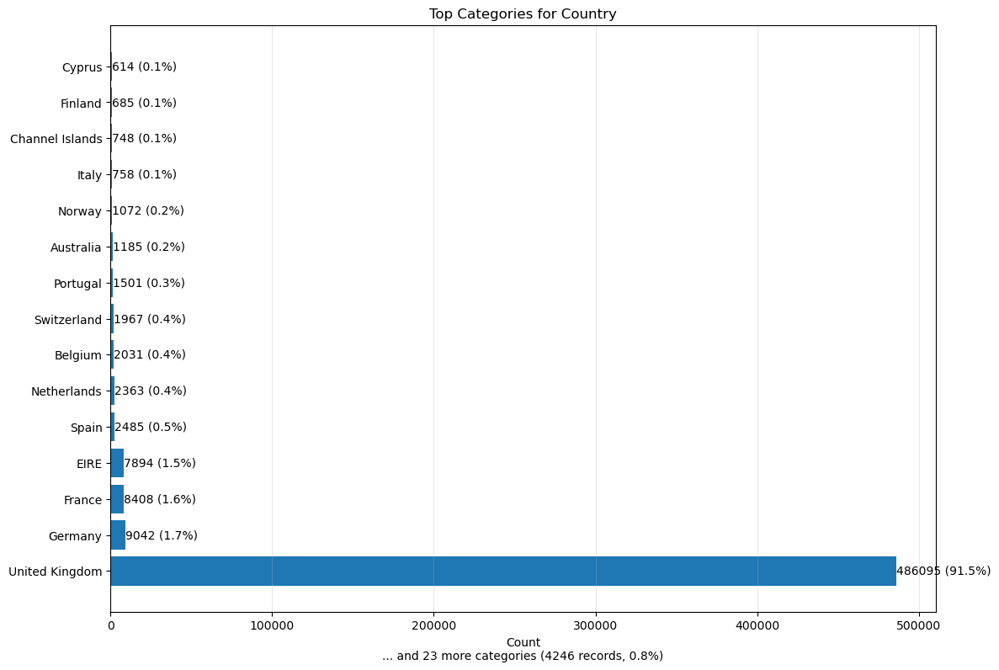

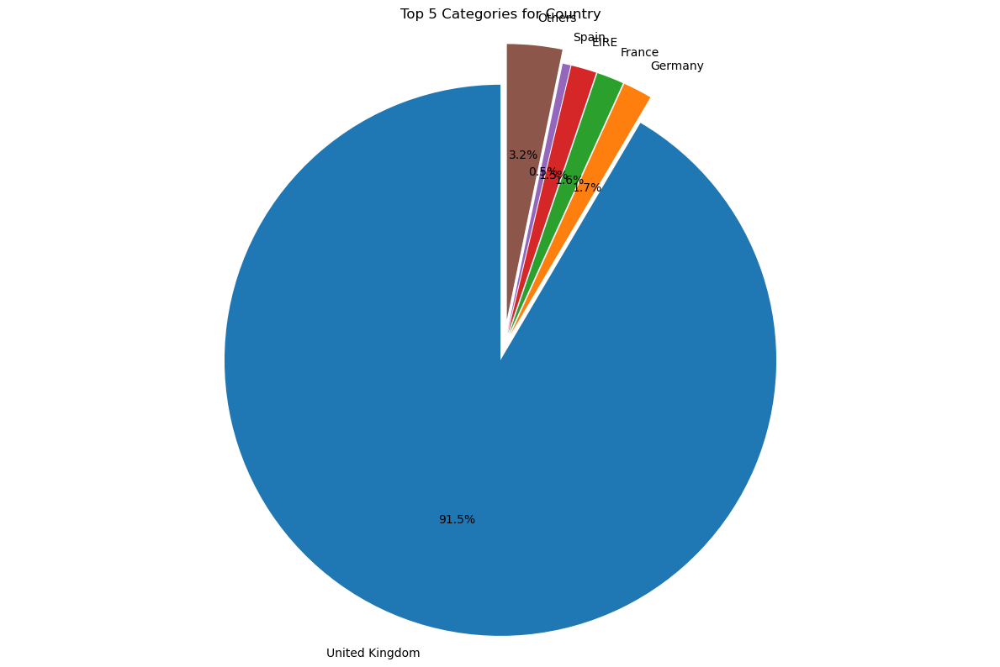

Visualizing Datetime Features...


C:\Users\acer\AppData\Local\Temp\ipykernel_102880\2157483082.py:120: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(monthly_counts.index, rotation=45)
C:\Users\acer\AppData\Local\Temp\ipykernel_102880\2157483082.py:130: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(day_counts.index, rotation=45)


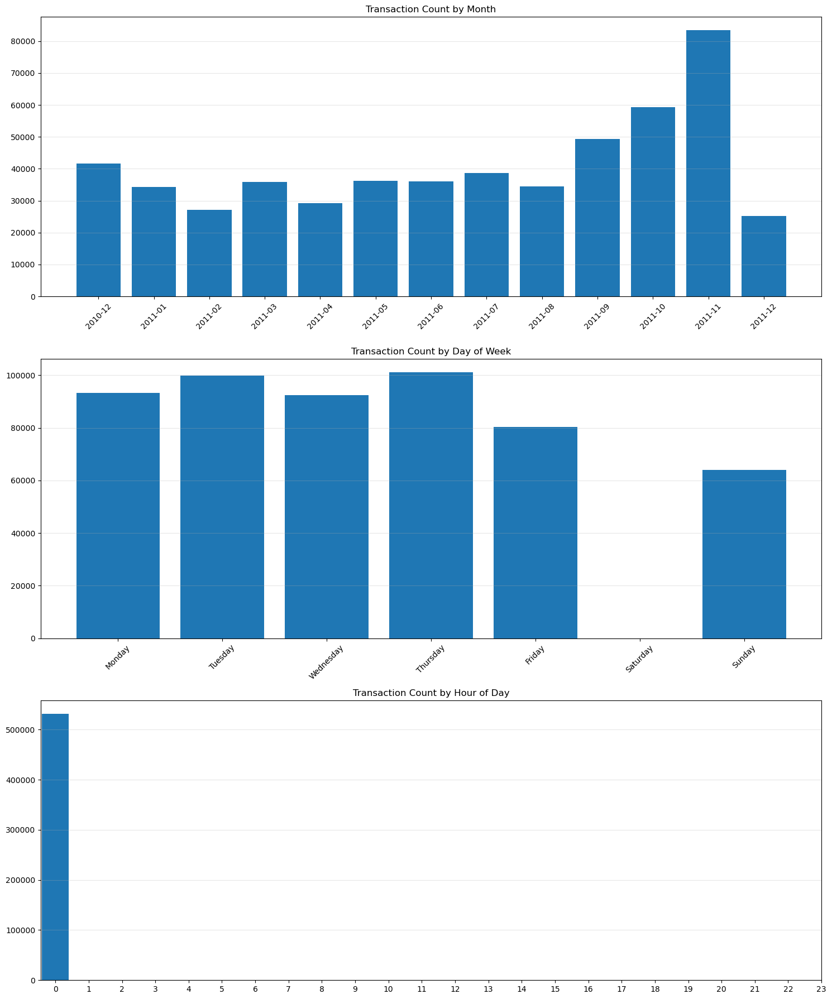

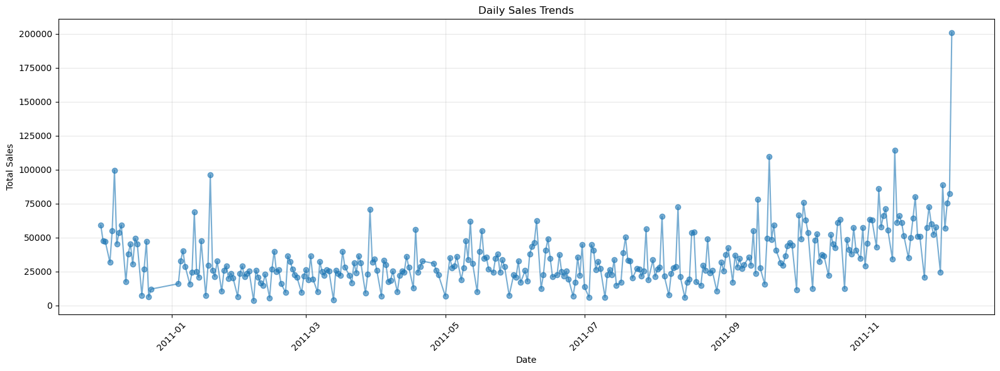


DataFrame Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 531094 entries, 0 to 531093
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    531094 non-null  object        
 1   StockCode    531094 non-null  object        
 2   Description  531094 non-null  object        
 3   Quantity     531094 non-null  int64         
 4   InvoiceDate  531094 non-null  datetime64[ns]
 5   UnitPrice    531094 non-null  float64       
 6   CustomerID   531094 non-null  object        
 7   Country      531094 non-null  object        
 8   Day_Number   531094 non-null  int64         
 9   TotalSales   531094 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(2), object(5)
memory usage: 40.5+ MB


In [5]:
def visualize_all_features(df):
    """Visualize all features in the DataFrame by data type"""
    print("Visualizing Numeric Features...")
    visualize_numeric_features(df)
    
    print("Visualizing Categorical Features...")
    visualize_categorical_features(df)
    
    print("Visualizing Datetime Features...")
    visualize_datetime_features(df)
    
    # Display the dataframe info as a summary
    print("\nDataFrame Information:")
    df.info()

# Call the main function to visualize all features
visualize_all_features(df)

#### 1. Aggregation by Invoice:

1. TotalSpend = sum of all TotalSales for that invoice
2. TotalQuantity = sum of all Quantity
3. InvoiceTotalItems = number of unique stockcode items in that invoice
4. Customer ID of that Invoice
5. Country where Invoice was recorded
6. Reference Day of Invoice

In [6]:
df_invoice_summary = (
    df
    .groupby('InvoiceNo', as_index=False)
    .agg(
        TotalSpend=('TotalSales', 'sum'),
        TotalQuantity=('Quantity', 'sum'),
        UniqueItems=('StockCode', 'nunique'), # number of different items in the invoice
        # Add Number of Customers associated with the invoice
        UniqueCustomers=('CustomerID', 'nunique'),
        # Add CustomerID to the groupby as we confirmed that 1 invoice is associated with 1 customer
        CustomerID=('CustomerID', 'first'),
        # Add Country to the groupby as we confirmed that 1 invoice is associated with 1 country
        Country=('Country', 'first'),
        # Add InvoiceDate to the groupby as we confirmed that 1 invoice is associated with 1 date
        DayNumber=('Day_Number', 'first'),
        # Add Number of Days associated with the invoice
        NumberOfDays=('Day_Number', 'nunique')
    )
)

df_invoice_summary.head(15)

,InvoiceNo,TotalSpend,TotalQuantity,UniqueItems,UniqueCustomers,CustomerID,Country,DayNumber,NumberOfDays
0,536365,139.12,40,7,1,17850,United Kingdom,1,1
1,536366,22.20,12,2,1,17850,United Kingdom,1,1
2,536367,278.73,83,12,1,13047,United Kingdom,1,1
3,536368,70.05,15,4,1,13047,United Kingdom,1,1
4,536369,17.85,3,1,1,13047,United Kingdom,1,1
5,536370,855.86,449,20,1,12583,France,1,1
6,536371,204.00,80,1,1,13748,United Kingdom,1,1
7,536372,22.20,12,2,1,17850,United Kingdom,1,1
8,536373,259.86,88,16,1,17850,United Kingdom,1,1
9,536374,350.40,32,1,1,15100,United Kingdom,1,1


In [7]:
#shape of the data
df_invoice_summary.shape

(20537, 9)

### 2. Aggregation by Product:

1. Total Product Descriptions = sum of Descriptions for that Stock Code
2. TotalSpend = sum of TotalSales
3. TotalQuantity = sum of Quantity
4. UniqueInvoices = number of unique invoices that listed the product
5. UniqueCustomers = number of unique customers who bought the product
6. UniqueCountries = number of unique countries where product was bought
7. TotalDaysSold = sum of Unique days that product was sold

In [8]:
product_group = df.groupby('StockCode', as_index=False)
df_product_summary = product_group.agg(
    # Total unique number of Descriptions per stockcode:
    NumberOfDescriptions=('Description', 'nunique'),
    # Product first Description:
    Description=('Description', 'first'),
    TotalSpend=('TotalSales', 'sum'),
    TotalQuantity=('Quantity', 'sum'),
    # Total number of unique invoices per stockcode:
    NumberOfInvoices=('InvoiceNo', 'nunique'),
    # Total number of unique customers per stockcode:
    NumberOfCustomers=('CustomerID', 'nunique'),
    # Total number of unique countries per stockcode:
    NumberOfCountries=('Country', 'nunique'),
    # Total number of unique dates per stockcode:
    NumberOfDates=('Day_Number', 'nunique')
)

df_product_summary.head(15)

,StockCode,NumberOfDescriptions,Description,TotalSpend,TotalQuantity,NumberOfInvoices,NumberOfCustomers,NumberOfCountries,NumberOfDates
0,10002,1,INFLATABLE POLITICAL GLOBE,759.89,1040,72,41,7,47
1,10080,1,GROOVY CACTUS INFLATABLE,119.09,473,23,20,1,21
2,10120,1,DOGGY RUBBER,40.53,193,29,25,2,24
3,10123C,1,HEARTS WRAPPING TAPE,3.25,5,3,3,1,3
4,10124A,1,SPOTS ON RED BOOKCOVER TAPE,6.72,16,5,5,1,5
5,10124G,1,ARMY CAMO BOOKCOVER TAPE,7.14,17,4,4,1,4
6,10125,1,MINI FUNKY DESIGN TAPES,994.84,1296,91,50,4,63
7,10133,1,COLOURING PENCILS BROWN TUBE,1544.22,2867,196,102,6,110
8,10135,1,COLOURING PENCILS BROWN TUBE,2207.39,2231,175,93,6,119
9,11001,1,ASSTD DESIGN RACING CAR PEN,2389.44,1615,113,45,8,89


In [9]:
# shape of the data
df_product_summary.shape

(3923, 9)

### 3. Aggregation by Identifiable Customer IDs (we exclude non-members)

1. TotalSpend = sum of TotalSales
2. TotalQuantity = sum of Quantity
3. FirstPurchaseDate = min(Day_Number)
4. LastPurchase Date
5. UniqueProducts = count of distinct StockCode
6. FavoriteProduct = product purchased most often (by quantity) or by spend
7. FavouriteDescription
8. PurchaseIntervalAvg = average gap between consecutive purchases
9. UniqueInvoices 
10. Country

In [10]:
# create a df_valid based on CustomerID != 'Non-Member' and 'TotalSales' > 0
df_valid = df[df['CustomerID'] != 'Non-Member']

# Basic customer-level aggregations
cust_grp = df_valid.groupby('CustomerID', as_index=False)
df_customer_summary = cust_grp.agg(
    TotalSpend=('TotalSales', 'sum'),
    TotalQuantity=('Quantity', 'sum'),
    FirstPurchaseDate=('InvoiceDate', 'min'),
    LastPurchaseDate=('InvoiceDate', 'max'),
    UniqueProducts=('StockCode', 'nunique'),
    # Add Number of Invoices per customer
    NumberOfInvoices=('InvoiceNo', 'nunique'),
    # Add Country the customer is associated with
    Country=('Country', 'first')
)

# Add FavoriteProduct: stockcode purchased most frequently by each customer
favorite_product = (
    df_valid
    .groupby(['CustomerID', 'StockCode'], as_index=False)['Quantity']
    .sum()
    .sort_values(['CustomerID', 'Quantity'], ascending=[True, False])
    .drop_duplicates(subset=['CustomerID'])  # keep top product per customer
    .rename(columns={'StockCode': 'FavoriteProduct'})
)

# Add FavoriteDescription: Description of the favorite product
favorite_description = (
    df_valid
    .merge(favorite_product, left_on=['CustomerID', 'StockCode'], right_on=['CustomerID', 'FavoriteProduct'], how='inner')
    .drop_duplicates(subset=['CustomerID'])
    .rename(columns={'Description': 'FavoriteDescription'})
)

# Merge favorite product into customer summary
df_customer_summary = df_customer_summary.merge(
    favorite_product[['CustomerID', 'FavoriteProduct']], on='CustomerID', how='left')

# Merge favorite description into customer summary
df_customer_summary = df_customer_summary.merge(
    favorite_description[['CustomerID', 'FavoriteDescription']], on='CustomerID', how='left')

# Define helper function for average purchase interval
def average_purchase_gap(sub_df):
    sub_df = sub_df.sort_values(by='InvoiceDate')
    gaps = sub_df['InvoiceDate'].diff().dt.days.dropna()
    return gaps.mean() if len(gaps) > 0 else 0

# Compute average purchase intervals
purchase_gaps = (
    df_valid.groupby('CustomerID')
    .apply(average_purchase_gap)
    .reset_index(name='PurchaseIntervalAvg')
)

# Merge purchase intervals into customer summary
df_customer_summary = df_customer_summary.merge(
    purchase_gaps, on='CustomerID', how='left')

# Display result
df_customer_summary.head(15)


C:\Users\acer\AppData\Local\Temp\ipykernel_102880\2450511090.py:53: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(average_purchase_gap)


,CustomerID,TotalSpend,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,FavoriteProduct,FavoriteDescription,PurchaseIntervalAvg
0,12346,77183.60,74215,2011-01-18,2011-01-18,1,1,United Kingdom,23166,MEDIUM CERAMIC TOP STORAGE JAR,0.000000
1,12347,4310.00,2458,2010-12-07,2011-12-07,103,7,Iceland,23076,ICE CREAM SUNDAE LIP GLOSS,2.016575
2,12348,1797.24,2341,2010-12-16,2011-09-25,22,4,Finland,23077,DOUGHNUT LIP GLOSS,9.433333
3,12349,1757.55,631,2011-11-21,2011-11-21,73,1,Italy,21231,SWEETHEART CERAMIC TRINKET BOX,0.000000
4,12350,334.40,197,2011-02-02,2011-02-02,17,1,Norway,22348,TEA BAG PLATE RED RETROSPOT,0.000000
5,12352,2506.04,536,2011-02-16,2011-11-03,59,8,Norway,84050,PINK HEART SHAPE EGG FRYING PAN,3.095238
6,12353,89.00,20,2011-05-19,2011-05-19,4,1,Bahrain,37446,MINI CAKE STAND WITH HANGING CAKES,0.000000
7,12354,1079.40,530,2011-04-21,2011-04-21,58,1,Spain,21239,PINK POLKADOT CUP,0.000000
8,12355,459.40,240,2011-05-09,2011-05-09,13,1,Bahrain,23076,ICE CREAM SUNDAE LIP GLOSS,0.000000
9,12356,2811.43,1591,2011-01-18,2011-11-17,53,3,Portugal,84991,60 TEATIME FAIRY CAKE CASES,5.224138


In [11]:
# inspect the shape of the data
df_customer_summary.shape

(4339, 11)

### (4) RFM Aggregation by Identifiable CustomerIDs

1. Recency = today’s date (or max date in dataset) - last purchase date
2. Frequency = count of distinct invoices (or transactions)
3. Monetary = sum of total spend (TotalSpend)

In [12]:
max_date = df_valid['InvoiceDate'].max()
snapshot_date = max_date + pd.Timedelta(days=1)

rfm_grp = df_valid.groupby('CustomerID', as_index=False)
df_rfm = rfm_grp.agg(
    Frequency=('InvoiceNo', 'nunique'),
    Monetary=('TotalSales', 'sum'),
    LastPurchaseDate=('InvoiceDate', 'max')
)

df_rfm['Recency'] = (snapshot_date - df_rfm['LastPurchaseDate']).dt.days
df_rfm.drop(columns=['LastPurchaseDate'], inplace=True)

df_rfm.head(15)

,CustomerID,Frequency,Monetary,Recency
0,12346,1,77183.60,326
1,12347,7,4310.00,3
2,12348,4,1797.24,76
3,12349,1,1757.55,19
4,12350,1,334.40,311
5,12352,8,2506.04,37
6,12353,1,89.00,205
7,12354,1,1079.40,233
8,12355,1,459.40,215
9,12356,3,2811.43,23


### (5) Estimation of CLV (Evaluation of CustomerIDs to Target)

A simple heuristic approach might be:
- CLV = (avg purchase value) * (purchase frequency per year) * (retention time in years)

1. Average purchase value = Monetary / Frequency
2. Frequency per year -> we need days active etc.
3. Let’s define an arbitrary retention time = 1 year for demonstration

In [13]:
df_clv = df_rfm.copy()
df_clv.rename(columns={'Monetary': 'TotalSpend'}, inplace=True)

df_clv.head()

,CustomerID,Frequency,TotalSpend,Recency
0,12346,1,77183.60,326
1,12347,7,4310.00,3
2,12348,4,1797.24,76
3,12349,1,1757.55,19
4,12350,1,334.40,311


In [14]:
df_clv['AvgPurchaseValue'] = df_clv['TotalSpend'] / df_clv['Frequency']

# approximate how many days from first to last purchase to get "days active"
cust_min_max = df_valid.groupby('CustomerID').agg(
    MinDate=('InvoiceDate', 'min'),
    MaxDate=('InvoiceDate', 'max')
).reset_index()

df_clv = df_clv.merge(cust_min_max, on='CustomerID', how='left')

df_clv.head()

,CustomerID,Frequency,TotalSpend,Recency,AvgPurchaseValue,MinDate,MaxDate
0,12346,1,77183.60,326,77183.600000,2011-01-18,2011-01-18
1,12347,7,4310.00,3,615.714286,2010-12-07,2011-12-07
2,12348,4,1797.24,76,449.310000,2010-12-16,2011-09-25
3,12349,1,1757.55,19,1757.550000,2011-11-21,2011-11-21
4,12350,1,334.40,311,334.400000,2011-02-02,2011-02-02


In [15]:
df_clv['DaysActive'] = (df_clv['MaxDate'] - df_clv['MinDate']).dt.days + 1


# if CustomerID's DaysActive > 1, then we can calculate the average purchase frequency:
df_clv['AvgPurchaseFrequency'] = np.where(df_clv['DaysActive'] > 1,
                                          (df_clv['Frequency'] - 1) / (df_clv['DaysActive'] - 1), 0)

df_clv.head()

,CustomerID,Frequency,TotalSpend,Recency,AvgPurchaseValue,MinDate,MaxDate,DaysActive,AvgPurchaseFrequency
0,12346,1,77183.60,326,77183.600000,2011-01-18,2011-01-18,1,0.000000
1,12347,7,4310.00,3,615.714286,2010-12-07,2011-12-07,366,0.016438
2,12348,4,1797.24,76,449.310000,2010-12-16,2011-09-25,284,0.010601
3,12349,1,1757.55,19,1757.550000,2011-11-21,2011-11-21,1,0.000000
4,12350,1,334.40,311,334.400000,2011-02-02,2011-02-02,1,0.000000


In [16]:
df_clv['PurchasesPerYear'] = df_clv['AvgPurchaseFrequency'] * 365

# Simple heuristic CLV
df_clv['CLVEstimate'] = df_clv['AvgPurchaseValue'] * df_clv['PurchasesPerYear'] * 1.0  # assume 1 year retention

df_clv.head()

,CustomerID,Frequency,TotalSpend,Recency,AvgPurchaseValue,MinDate,MaxDate,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate
0,12346,1,77183.60,326,77183.600000,2011-01-18,2011-01-18,1,0.000000,0.000000,0.000000
1,12347,7,4310.00,3,615.714286,2010-12-07,2011-12-07,366,0.016438,6.000000,3694.285714
2,12348,4,1797.24,76,449.310000,2010-12-16,2011-09-25,284,0.010601,3.869258,1738.496290
3,12349,1,1757.55,19,1757.550000,2011-11-21,2011-11-21,1,0.000000,0.000000,0.000000
4,12350,1,334.40,311,334.400000,2011-02-02,2011-02-02,1,0.000000,0.000000,0.000000


In [17]:
df_clv.drop(columns=['MinDate', 'MaxDate'], inplace=True)
df_clv.head(15)

,CustomerID,Frequency,TotalSpend,Recency,AvgPurchaseValue,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate
0,12346,1,77183.60,326,77183.600000,1,0.000000,0.000000,0.000000
1,12347,7,4310.00,3,615.714286,366,0.016438,6.000000,3694.285714
2,12348,4,1797.24,76,449.310000,284,0.010601,3.869258,1738.496290
3,12349,1,1757.55,19,1757.550000,1,0.000000,0.000000,0.000000
4,12350,1,334.40,311,334.400000,1,0.000000,0.000000,0.000000
5,12352,8,2506.04,37,313.255000,261,0.026923,9.826923,3078.332788
6,12353,1,89.00,205,89.000000,1,0.000000,0.000000,0.000000
7,12354,1,1079.40,233,1079.400000,1,0.000000,0.000000,0.000000
8,12355,1,459.40,215,459.400000,1,0.000000,0.000000,0.000000
9,12356,3,2811.43,23,937.143333,304,0.006601,2.409241,2257.804070


In [18]:
# shape of df_clv
df_clv.shape

(4339, 9)

Combine CLV and customer_summary dataframes:

In [19]:
# remove duplicate column 'TotalSpend' from df_customer_summary
df_customer_summary.drop(columns=['TotalSpend'], inplace=True)

In [20]:
# merge df_clv with df_customer_summary as df_customer_all
df_customer_all = pd.merge(df_customer_summary, df_clv, how='left', on='CustomerID')
df_customer_all.head()

,CustomerID,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,FavoriteProduct,FavoriteDescription,PurchaseIntervalAvg,Frequency,TotalSpend,Recency,AvgPurchaseValue,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate
0,12346,74215,2011-01-18,2011-01-18,1,1,United Kingdom,23166,MEDIUM CERAMIC TOP STORAGE JAR,0.000000,1,77183.60,326,77183.600000,1,0.000000,0.000000,0.000000
1,12347,2458,2010-12-07,2011-12-07,103,7,Iceland,23076,ICE CREAM SUNDAE LIP GLOSS,2.016575,7,4310.00,3,615.714286,366,0.016438,6.000000,3694.285714
2,12348,2341,2010-12-16,2011-09-25,22,4,Finland,23077,DOUGHNUT LIP GLOSS,9.433333,4,1797.24,76,449.310000,284,0.010601,3.869258,1738.496290
3,12349,631,2011-11-21,2011-11-21,73,1,Italy,21231,SWEETHEART CERAMIC TRINKET BOX,0.000000,1,1757.55,19,1757.550000,1,0.000000,0.000000,0.000000
4,12350,197,2011-02-02,2011-02-02,17,1,Norway,22348,TEA BAG PLATE RED RETROSPOT,0.000000,1,334.40,311,334.400000,1,0.000000,0.000000,0.000000


In [21]:
# rearrange the columns such that 2nd 3rd 4th column is Recency, Frequency, TotalSpend, rest of the columns are as it is
df_customer_all = df_customer_all[['CustomerID', 'Recency', 'Frequency', 'TotalSpend'] + [col for col in df_customer_all.columns if col not in ['CustomerID', 'Recency', 'Frequency', 'TotalSpend']]]
df_customer_all.head()

,CustomerID,Recency,Frequency,TotalSpend,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,FavoriteProduct,FavoriteDescription,PurchaseIntervalAvg,AvgPurchaseValue,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate
0,12346,326,1,77183.60,74215,2011-01-18,2011-01-18,1,1,United Kingdom,23166,MEDIUM CERAMIC TOP STORAGE JAR,0.000000,77183.600000,1,0.000000,0.000000,0.000000
1,12347,3,7,4310.00,2458,2010-12-07,2011-12-07,103,7,Iceland,23076,ICE CREAM SUNDAE LIP GLOSS,2.016575,615.714286,366,0.016438,6.000000,3694.285714
2,12348,76,4,1797.24,2341,2010-12-16,2011-09-25,22,4,Finland,23077,DOUGHNUT LIP GLOSS,9.433333,449.310000,284,0.010601,3.869258,1738.496290
3,12349,19,1,1757.55,631,2011-11-21,2011-11-21,73,1,Italy,21231,SWEETHEART CERAMIC TRINKET BOX,0.000000,1757.550000,1,0.000000,0.000000,0.000000
4,12350,311,1,334.40,197,2011-02-02,2011-02-02,17,1,Norway,22348,TEA BAG PLATE RED RETROSPOT,0.000000,334.400000,1,0.000000,0.000000,0.000000


In [22]:
df_customer_all.shape

(4339, 18)

## 2.3 Data Transformations

### 2.3.1 Clustering for Product Categories: 

- At the end, I would like to see which categories identified by unsupervised learning are from products that are recommended from the antedecent to the consequent.
- Hence, we do a little dimension reduction here which is categorizing the products into arbitrary categories.
- Below, we perform KMeans with TF-IDF Vectorizer

In [23]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Day_Number,TotalSales
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01,2.55,17850,United Kingdom,1,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01,3.39,17850,United Kingdom,1,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01,2.75,17850,United Kingdom,1,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01,3.39,17850,United Kingdom,1,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01,3.39,17850,United Kingdom,1,20.34


In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from kneed import KneeLocator

# Step 1: Extract unique StockCode-Description pairs
product_descriptions = (
    df[['StockCode', 'Description']]
    .drop_duplicates()
    .dropna()
    .reset_index(drop=True)
)

product_descriptions.shape

(4195, 2)

In [25]:
product_descriptions

,StockCode,Description
0,85123A,WHITE HANGING HEART T-LIGHT HOLDER
1,71053,WHITE METAL LANTERN
2,84406B,CREAM CUPID HEARTS COAT HANGER
3,84029G,KNITTED UNION FLAG HOT WATER BOTTLE
4,84029E,RED WOOLLY HOTTIE WHITE HEART.
...,...,...
4190,90214U,"LETTER ""U"" BLING KEY RING"
4191,23406,CHECK
4192,47591b,SCOTTIES CHILDRENS APRON
4193,85123A,CREAM HANGING HEART T-LIGHT HOLDER


In [26]:
# Step 2: TF-IDF Vectorization of product descriptions
tfidf = TfidfVectorizer(stop_words='english')
X_tfidf = tfidf.fit_transform(product_descriptions['Description'])


In [27]:
# Step 3: Elbow Method to determine optimal number of clusters
sse = []
k_range = range(2, 21)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_tfidf)
    sse.append(kmeans.inertia_)

# Use KneeLocator to find the elbow
kneedle = KneeLocator(k_range, sse, curve="convex", direction="decreasing")
optimal_k = kneedle.elbow

optimal_k

8

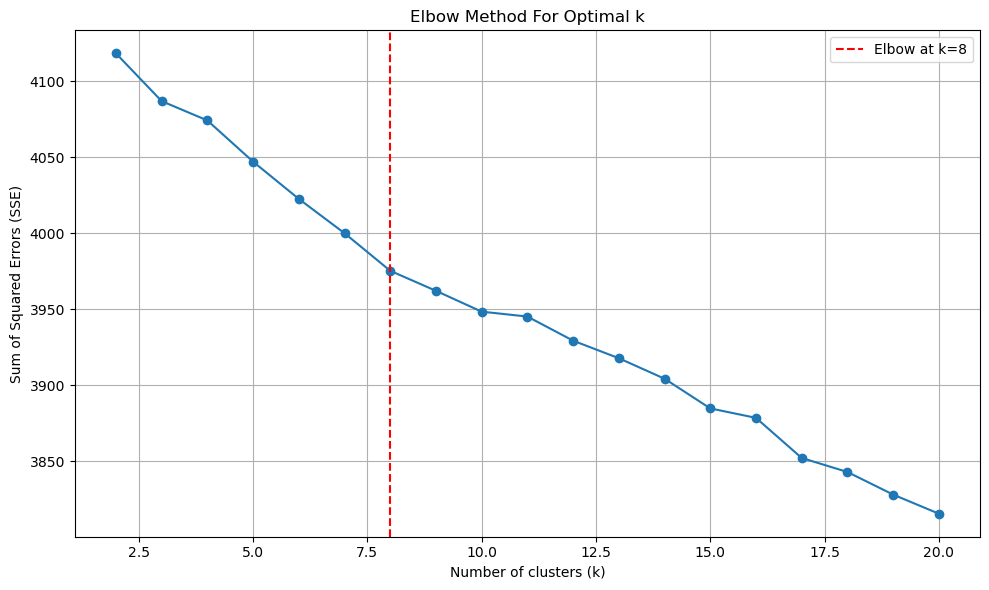

In [28]:
# Plot the elbow graph
plt.figure(figsize=(10, 6))
plt.plot(k_range, sse, marker='o')
plt.axvline(optimal_k, color='red', linestyle='--', label=f'Elbow at k={optimal_k}')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [29]:
# optimal number of product clusters
optimal_k

8

In [30]:
# Step 4: KMeans Clustering
n_clusters = optimal_k  # Adjust based on elbow method
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
product_descriptions['ProductCategory'] = kmeans.fit_predict(X_tfidf)


In [31]:
# Step 5: Create final product-category mapping
df_product_category_map = product_descriptions[['StockCode', 'ProductCategory']]

df_product_category_map


,StockCode,ProductCategory
0,85123A,3
1,71053,1
2,84406B,1
3,84029G,1
4,84029E,3
...,...,...
4190,90214U,1
4191,23406,1
4192,47591b,1
4193,85123A,3


In [32]:
# Step 6: Merge back into main df if needed
df = df.merge(df_product_category_map, on='StockCode', how='left')

df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Day_Number,TotalSales,ProductCategory
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01,2.55,17850,United Kingdom,1,15.30,3
1,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01,2.55,17850,United Kingdom,1,15.30,3
2,536365,71053,WHITE METAL LANTERN,6,2010-12-01,3.39,17850,United Kingdom,1,20.34,1
3,536365,71053,WHITE METAL LANTERN,6,2010-12-01,3.39,17850,United Kingdom,1,20.34,1
4,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01,2.75,17850,United Kingdom,1,22.00,1


In [33]:
# check unique values of 'ProductCategory'
df['ProductCategory'].unique()

array([3, 1, 2, 7, 0, 6, 4, 5])

### 2.3.2 Feature Scaling for Clustering Algorithm

In [34]:
df_customer_all.head()

,CustomerID,Recency,Frequency,TotalSpend,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,FavoriteProduct,FavoriteDescription,PurchaseIntervalAvg,AvgPurchaseValue,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate
0,12346,326,1,77183.60,74215,2011-01-18,2011-01-18,1,1,United Kingdom,23166,MEDIUM CERAMIC TOP STORAGE JAR,0.000000,77183.600000,1,0.000000,0.000000,0.000000
1,12347,3,7,4310.00,2458,2010-12-07,2011-12-07,103,7,Iceland,23076,ICE CREAM SUNDAE LIP GLOSS,2.016575,615.714286,366,0.016438,6.000000,3694.285714
2,12348,76,4,1797.24,2341,2010-12-16,2011-09-25,22,4,Finland,23077,DOUGHNUT LIP GLOSS,9.433333,449.310000,284,0.010601,3.869258,1738.496290
3,12349,19,1,1757.55,631,2011-11-21,2011-11-21,73,1,Italy,21231,SWEETHEART CERAMIC TRINKET BOX,0.000000,1757.550000,1,0.000000,0.000000,0.000000
4,12350,311,1,334.40,197,2011-02-02,2011-02-02,17,1,Norway,22348,TEA BAG PLATE RED RETROSPOT,0.000000,334.400000,1,0.000000,0.000000,0.000000


We skip the one-hot-encoding of 'Countries' which by right should be done to ensure that distances contribute to the cluster.

However because we saw that from before most of the values of 'Countries' come from the UK, even if we one-hot encode them, it causes the country columns to make the dataframe large, and not ideal because:

1. Signal-to-noise ratio: With 38 sparse binary columns where most are nearly all zeros, you'll add dimensions with very little signal
2. Curse of dimensionality: Adding many sparse dimensions can degrade clustering performance
3. Feature importance dilution: The 38 country columns could overshadow more informative numerical features
4. Computational inefficiency: More dimensions means more processing time with minimal benefit

In [35]:
from sklearn.preprocessing import StandardScaler

# Select relevant behavioral numerical features
features_to_scale = [
    'Recency', 'Frequency', 'TotalSpend', 'TotalQuantity',
    'UniqueProducts', 'NumberOfInvoices',
    'PurchaseIntervalAvg', 'AvgPurchaseValue',
    'DaysActive', 'AvgPurchaseFrequency', 'PurchasesPerYear', 'CLVEstimate'
]

# Standardize
scaler = StandardScaler()
scaled_values = scaler.fit_transform(df_customer_all[features_to_scale])

# Create new DataFrame
df_customer_scaled = df_customer_all.copy()
df_customer_scaled[features_to_scale] = scaled_values

df_customer_scaled.head()

,CustomerID,Recency,Frequency,TotalSpend,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,FavoriteProduct,FavoriteDescription,PurchaseIntervalAvg,AvgPurchaseValue,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate
0,12346,2.329673,-0.424675,8.359634,14.445201,2011-01-18,2011-01-18,-0.708687,-0.424675,United Kingdom,23166,MEDIUM CERAMIC TOP STORAGE JAR,-0.298358,42.739247,-0.989005,-0.059386,-0.059386,-0.083834
1,12347,-0.900449,0.354080,0.251046,0.250006,2010-12-07,2011-12-07,0.486336,0.354080,Iceland,23076,ICE CREAM SUNDAE LIP GLOSS,-0.111881,0.109496,1.772069,-0.027266,-0.027266,-0.010358
2,12348,-0.170421,-0.035297,-0.028546,0.226861,2010-12-16,2011-09-25,-0.462653,-0.035297,Finland,23077,DOUGHNUT LIP GLOSS,0.573961,0.016849,1.151773,-0.038673,-0.038673,-0.049257
3,12349,-0.740443,-0.424675,-0.032963,-0.111417,2011-11-21,2011-11-21,0.134858,-0.424675,Italy,21231,SWEETHEART CERAMIC TRINKET BOX,-0.298358,0.745221,-0.989005,-0.059386,-0.059386,-0.083834
4,12350,2.179667,-0.424675,-0.191315,-0.197272,2011-02-02,2011-02-02,-0.521232,-0.424675,Norway,22348,TEA BAG PLATE RED RETROSPOT,-0.298358,-0.047128,-0.989005,-0.059386,-0.059386,-0.083834


## 2.4 Correlation Matrix for Identifying Independent Variables

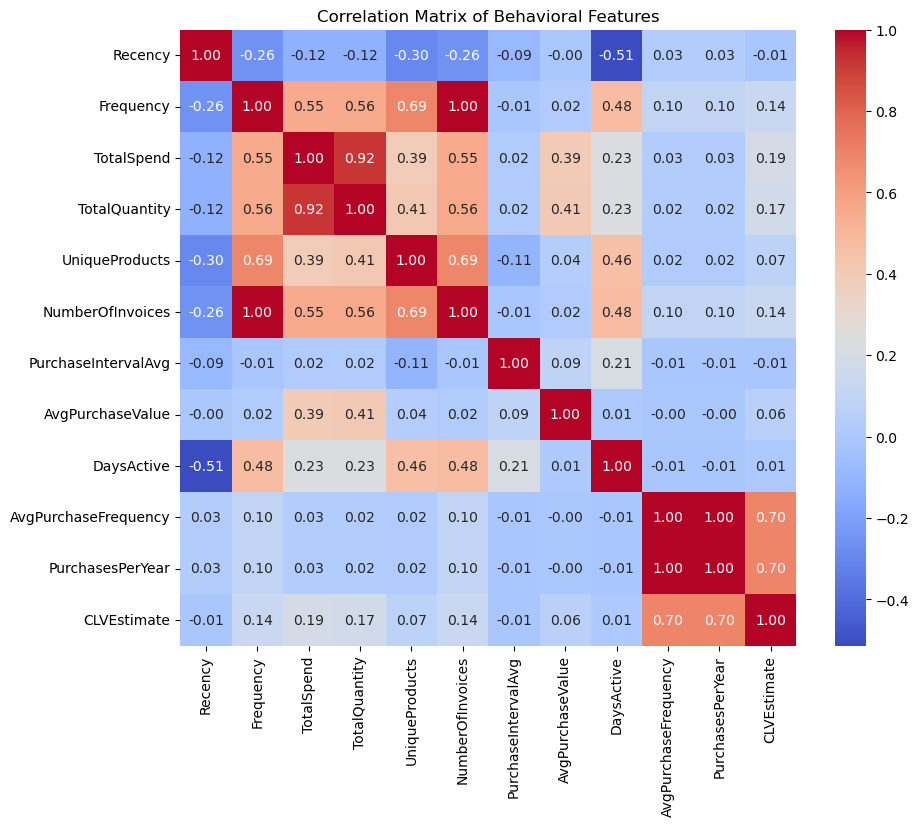

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

# Correlation heatmap
plt.figure(figsize=(10, 8))
corr = df_customer_all[features_to_scale].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation Matrix of Behavioral Features")
plt.show()

Finally we remove or reduce highly correlated features to get independent features, to avoid redundant distance effects in clustering and get cleaner clusters.

In [37]:
# Select upper triangle of correlation matrix
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))

# Drop features with correlation > 0.85
to_drop = [column for column in upper.columns if any(upper[column] > 0.85)]
print("Dropped due to high correlation:", to_drop)

# Final independent features
final_features = [f for f in features_to_scale if f not in to_drop]
print("Selected independent variables:", final_features)

Dropped due to high correlation: ['TotalQuantity', 'NumberOfInvoices', 'PurchasesPerYear']
Selected independent variables: ['Recency', 'Frequency', 'TotalSpend', 'UniqueProducts', 'PurchaseIntervalAvg', 'AvgPurchaseValue', 'DaysActive', 'AvgPurchaseFrequency', 'CLVEstimate']


- Additionally, some variables are similar in the business sense as they can be said to be conceptually derived variables.

- Hence, we remove them as they introduce dimension bias, dimensionality issues and interpretability problems when we create the clusters later

In [38]:
# remove AvgPurchaseValue, AvgPurchaseFrequency, CLVEstimate from the final features
features_for_clustering = [f for f in final_features if f not in ['AvgPurchaseValue', 'AvgPurchaseFrequency', 'CLVEstimate']]
print("Selected features for clustering:", features_for_clustering)

Selected features for clustering: ['Recency', 'Frequency', 'TotalSpend', 'UniqueProducts', 'PurchaseIntervalAvg', 'DaysActive']


# 3. Clustering Algorithms

To cluster customers primarily (instead of the above where we experimented with clustering products to categories), now we choose Kmeans and Hierarchical Clustering due to the number of features in our feature matrix. DBScan would not be a good idea as it is more suitable for low dimensionality, and performs the worst on large datasets like this one we have.

### 3.1 KMeans Clustering

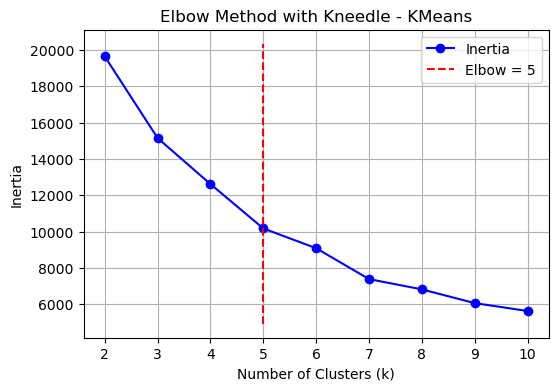

In [39]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from kneed import KneeLocator
import matplotlib.pyplot as plt

# Data matrix
X = df_customer_scaled[features_for_clustering]

# --- Elbow Method with Kneedle ---
inertia = []
K = range(2, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

# Kneedle to detect elbow point
kneedle = KneeLocator(K, inertia, curve='convex', direction='decreasing')
optimal_k_kmeans = kneedle.knee

# Plot elbow
plt.figure(figsize=(6, 4))
plt.plot(K, inertia, 'bo-', label='Inertia')
plt.vlines(optimal_k_kmeans, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', colors='red', label=f'Elbow = {optimal_k_kmeans}')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method with Kneedle - KMeans")
plt.legend()
plt.grid(True)
plt.show()

In [40]:
# Fit KMeans with optimal_k_kmeans

kmeans = KMeans(n_clusters=optimal_k_kmeans, random_state=42)
df_customer_scaled['Cluster'] = kmeans.fit_predict(X)

# Save the labels separately
labels = df_customer_scaled['Cluster']

# Merge cluster labels back to original unscaled data for interpretation
df_customer_labeled = df_customer_all.copy()
df_customer_labeled['Cluster'] = labels

df_customer_labeled.head()

,CustomerID,Recency,Frequency,TotalSpend,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,FavoriteProduct,FavoriteDescription,PurchaseIntervalAvg,AvgPurchaseValue,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate,Cluster
0,12346,326,1,77183.60,74215,2011-01-18,2011-01-18,1,1,United Kingdom,23166,MEDIUM CERAMIC TOP STORAGE JAR,0.000000,77183.600000,1,0.000000,0.000000,0.000000,4
1,12347,3,7,4310.00,2458,2010-12-07,2011-12-07,103,7,Iceland,23076,ICE CREAM SUNDAE LIP GLOSS,2.016575,615.714286,366,0.016438,6.000000,3694.285714,3
2,12348,76,4,1797.24,2341,2010-12-16,2011-09-25,22,4,Finland,23077,DOUGHNUT LIP GLOSS,9.433333,449.310000,284,0.010601,3.869258,1738.496290,3
3,12349,19,1,1757.55,631,2011-11-21,2011-11-21,73,1,Italy,21231,SWEETHEART CERAMIC TRINKET BOX,0.000000,1757.550000,1,0.000000,0.000000,0.000000,1
4,12350,311,1,334.40,197,2011-02-02,2011-02-02,17,1,Norway,22348,TEA BAG PLATE RED RETROSPOT,0.000000,334.400000,1,0.000000,0.000000,0.000000,4


In [41]:
# Analyze cluster characteristics (mean per feature)
cluster_kmeans = df_customer_labeled.groupby('Cluster')[features_for_clustering].mean().round(2)
cluster_kmeans

,Recency,Frequency,TotalSpend,UniqueProducts,PurchaseIntervalAvg,DaysActive
Cluster,,,,,,
0,60.90,2.70,1137.34,2.05,126.02,250.05
1,58.18,2.08,742.31,36.91,2.29,59.01
2,7.00,75.24,108781.56,700.12,6.39,337.06
3,30.45,7.95,3379.47,109.57,4.15,288.20
4,258.34,1.49,620.73,23.35,0.98,20.34


In [42]:
# cluster sizes for kmeans
cluster_sizes_kmeans = df_customer_labeled['Cluster'].value_counts().sort_index()
cluster_sizes_kmeans

Cluster
0      20
1    1831
2      17
3    1503
4     968
Name: count, dtype: int64

In [43]:
# compute silhouette score for kmeans to compare with hierarchical clustering later
silhouette_kmeans = silhouette_score(X, labels)
print("Silhouette Score for KMeans:", silhouette_kmeans)

Silhouette Score for KMeans: 0.3837168660216574


### 3.2 Hierarchical - Agglomerative Method with customer df

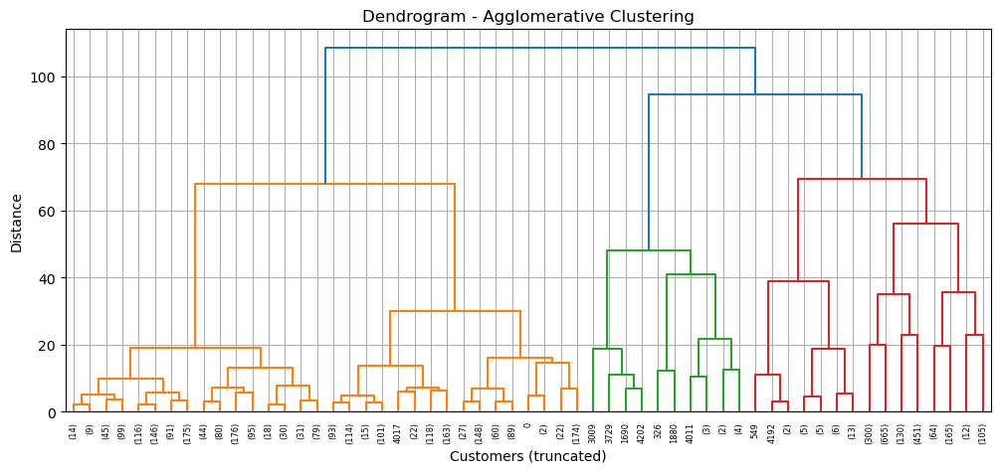

In [44]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, inconsistent
import scipy.cluster.hierarchy as sch

# Compute linkage matrix
linked = linkage(X, method='ward')

# Plot dendrogram
plt.figure(figsize=(12, 5))
dendrogram(linked, truncate_mode='level', p=5) # p = 5 to show only the last 5 merges
plt.title("Dendrogram - Agglomerative Clustering")
plt.xlabel("Customers (truncated)")
plt.ylabel("Distance")
plt.grid(True)
plt.show()

In [45]:
# Find optimal number of clusters using inconsistency method
# We will use silhouette score to evaluate the optimal number of clusters

best_score = -1
best_depth = None
best_labels = None

# Try depths from 2 to 10
for depth in range(2, 11):
    incons = inconsistent(linked, depth)
    threshold = np.mean(incons[:, -1])
    
    labels = fcluster(linked, threshold, criterion='inconsistent')
    
    # Skip if only 1 cluster (invalid silhouette)
    if len(np.unique(labels)) < 2:
        continue
    
    score = silhouette_score(X, labels)
    
    if score > best_score:
        best_score = score
        best_depth = depth
        best_labels = labels

print(f"Best depth: {best_depth}")
print(f"Optimal clusters: {len(np.unique(best_labels))}")
print(f"Silhouette score: {best_score:.3f}")

Best depth: 3
Optimal clusters: 1676
Silhouette score: 0.253


Using silhouette score and with Hierarchical Clustering, we find that the score == 0.253 is worse than Kmeans at 0.383.

Hence we fit predict the Kmeans model back to the df_customer_labelled to generate clusters optimally.

#### Inspecting the Labelling of Clusters by Customers

In [46]:
df_customer_labeled

,CustomerID,Recency,Frequency,TotalSpend,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,FavoriteProduct,FavoriteDescription,PurchaseIntervalAvg,AvgPurchaseValue,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate,Cluster
0,12346,326,1,77183.60,74215,2011-01-18,2011-01-18,1,1,United Kingdom,23166,MEDIUM CERAMIC TOP STORAGE JAR,0.000000,77183.600000,1,0.000000,0.000000,0.000000,4
1,12347,3,7,4310.00,2458,2010-12-07,2011-12-07,103,7,Iceland,23076,ICE CREAM SUNDAE LIP GLOSS,2.016575,615.714286,366,0.016438,6.000000,3694.285714,3
2,12348,76,4,1797.24,2341,2010-12-16,2011-09-25,22,4,Finland,23077,DOUGHNUT LIP GLOSS,9.433333,449.310000,284,0.010601,3.869258,1738.496290,3
3,12349,19,1,1757.55,631,2011-11-21,2011-11-21,73,1,Italy,21231,SWEETHEART CERAMIC TRINKET BOX,0.000000,1757.550000,1,0.000000,0.000000,0.000000,1
4,12350,311,1,334.40,197,2011-02-02,2011-02-02,17,1,Norway,22348,TEA BAG PLATE RED RETROSPOT,0.000000,334.400000,1,0.000000,0.000000,0.000000,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4334,18280,278,1,180.60,45,2011-03-07,2011-03-07,10,1,United Kingdom,22084,PAPER CHAIN KIT EMPIRE,0.000000,180.600000,1,0.000000,0.000000,0.000000,4
4335,18281,181,1,80.82,54,2011-06-12,2011-06-12,7,1,United Kingdom,22028,PENNY FARTHING BIRTHDAY CARD,0.000000,80.820000,1,0.000000,0.000000,0.000000,4
4336,18282,8,2,178.05,103,2011-08-05,2011-12-02,12,2,United Kingdom,23187,FRENCH STYLE STORAGE JAR BONBONS,10.818182,89.025000,120,0.008403,3.067227,273.059874,1
4337,18283,4,16,2094.88,1397,2011-01-06,2011-12-06,263,16,United Kingdom,22418,10 COLOUR SPACEBOY PEN,0.442384,130.930000,335,0.044910,16.392216,2146.232784,3


# 4. Model Interpretation

### 4.1 Customer Segments: Aggregating clusters to get some descriptive insights

In [47]:
# Summary of clusters with key business variables, cluster size and CLVEstimate
summary_vars = features_to_scale

# .mean() is also applied to CLVEstimate as it is a heuristic estimate
cluster_summary = df_customer_labeled.groupby('Cluster')[summary_vars].mean().round(2)

cluster_summary


,Recency,Frequency,TotalSpend,TotalQuantity,UniqueProducts,NumberOfInvoices,PurchaseIntervalAvg,AvgPurchaseValue,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate
Cluster,,,,,,,,,,,,
0,60.90,2.70,1137.34,1526.55,2.05,2.70,126.02,432.23,250.05,0.01,2.60,1064.02
1,58.18,2.08,742.31,462.71,36.91,2.08,2.29,371.25,59.01,0.02,8.92,4021.52
2,7.00,75.24,108781.56,58573.29,700.12,75.24,6.39,6929.57,337.06,0.21,76.76,117605.32
3,30.45,7.95,3379.47,1979.87,109.57,7.95,4.15,402.32,288.20,0.02,8.73,3704.52
4,258.34,1.49,620.73,343.43,23.35,1.49,0.98,420.83,20.34,0.05,17.90,3447.77


C:\Users\acer\AppData\Local\Temp\ipykernel_102880\1750458530.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_summary.index, y=cluster_summary['CLVEstimate'], palette='viridis')


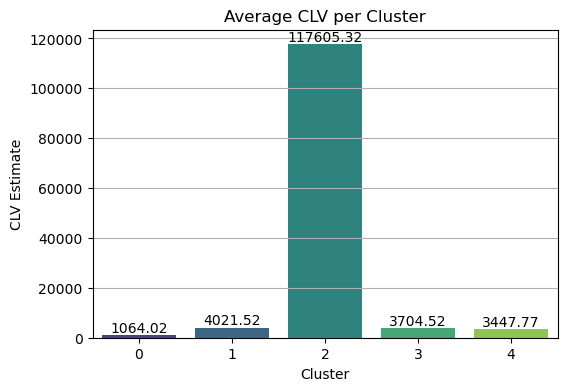

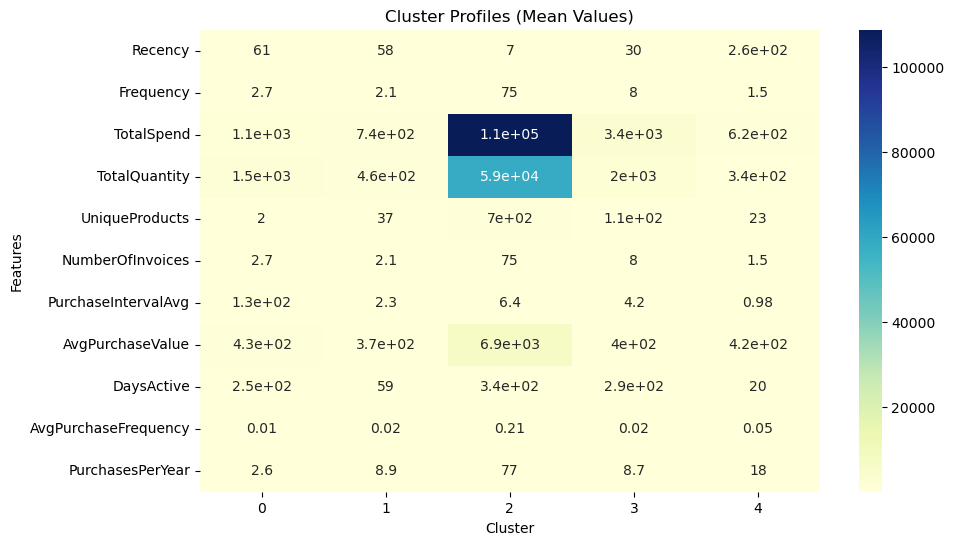

In [48]:
# Plot average CLV by cluster
plt.figure(figsize=(6,4))
sns.barplot(x=cluster_summary.index, y=cluster_summary['CLVEstimate'], palette='viridis')
plt.title("Average CLV per Cluster")
plt.xlabel("Cluster")
plt.ylabel("CLV Estimate")
# Label each bar with its CLV estimate
for i, v in enumerate(cluster_summary['CLVEstimate']):
    plt.text(i, v, str(v), ha='center', va='bottom')
plt.grid(True, axis='y')
plt.show()

# Heatmap of cluster means (normalized)
plt.figure(figsize=(10,6))
sns.heatmap(cluster_summary.drop(columns='CLVEstimate').T, annot=True, cmap='YlGnBu')
plt.title("Cluster Profiles (Mean Values)")
plt.ylabel("Features")
plt.xlabel("Cluster")
plt.show()

### 4.2 Encoding Derived Product Categories Obtained Earlier into Dataframe by Customer and Product Category

In [49]:
# Group by Customer and ProductCategory to get total spend per category
df_customer_category = (
    df.groupby(['CustomerID', 'ProductCategory'], as_index=False)
      .agg({'TotalSales': 'sum'})
      .rename(columns={'TotalSales': 'Spend'})
)

df_customer_category

,CustomerID,ProductCategory,Spend
0,12346,1,77183.60
1,12347,0,80.40
2,12347,1,3247.87
3,12347,2,469.15
4,12347,3,277.98
...,...,...,...
21174,Non-Member,3,131327.84
21175,Non-Member,4,44002.42
21176,Non-Member,5,5002.23
21177,Non-Member,6,71143.31


In [50]:
# Pivot into wide format (One-Hot-style encoding per category)
df_customer_category_matrix = df_customer_category.pivot_table(
    index='CustomerID',
    columns='ProductCategory',
    values='Spend',
    fill_value=0
).reset_index()

df_customer_category_matrix.columns = [
    f'CatSpend_{int(col)}' if col != 'CustomerID' else col 
    for col in df_customer_category_matrix.columns
]

df_customer_category_matrix


,CustomerID,CatSpend_0,CatSpend_1,CatSpend_2,CatSpend_3,CatSpend_4,CatSpend_5,CatSpend_6,CatSpend_7
0,12346,0.00,77183.60,0.00,0.00,0.00,0.00,0.00,0.00
1,12347,80.40,3247.87,469.15,277.98,26.56,0.00,278.00,226.10
2,12348,41.76,1522.72,191.00,0.00,0.00,0.00,63.60,41.76
3,12349,17.85,1209.85,399.02,139.65,0.00,0.00,19.80,256.60
4,12350,40.20,271.10,0.00,0.00,0.00,0.00,17.70,20.40
...,...,...,...,...,...,...,...,...,...
4335,18281,0.00,79.92,33.90,0.00,0.00,0.00,0.00,0.00
4336,18282,0.00,171.91,6.64,0.00,0.00,0.00,13.00,0.00
4337,18283,40.68,1920.38,197.13,104.25,0.00,2.55,104.96,151.22
4338,18287,30.30,673.12,535.24,62.64,380.88,0.00,129.30,40.80


In [51]:
# Merge encoded category features into main supervised dataset
df_customer_labeled = df_customer_labeled.merge(
    df_customer_category_matrix,
    on='CustomerID',
    how='left'
)

# Fill any missing category values with 0 (no spend in that category)
df_customer_labeled.fillna(0, inplace=True)

df_customer_labeled

,CustomerID,Recency,Frequency,TotalSpend,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,...,CLVEstimate,Cluster,CatSpend_0,CatSpend_1,CatSpend_2,CatSpend_3,CatSpend_4,CatSpend_5,CatSpend_6,CatSpend_7
0,12346,326,1,77183.60,74215,2011-01-18,2011-01-18,1,1,United Kingdom,...,0.000000,4,0.00,77183.60,0.00,0.00,0.00,0.00,0.00,0.00
1,12347,3,7,4310.00,2458,2010-12-07,2011-12-07,103,7,Iceland,...,3694.285714,3,80.40,3247.87,469.15,277.98,26.56,0.00,278.00,226.10
2,12348,76,4,1797.24,2341,2010-12-16,2011-09-25,22,4,Finland,...,1738.496290,3,41.76,1522.72,191.00,0.00,0.00,0.00,63.60,41.76
3,12349,19,1,1757.55,631,2011-11-21,2011-11-21,73,1,Italy,...,0.000000,1,17.85,1209.85,399.02,139.65,0.00,0.00,19.80,256.60
4,12350,311,1,334.40,197,2011-02-02,2011-02-02,17,1,Norway,...,0.000000,4,40.20,271.10,0.00,0.00,0.00,0.00,17.70,20.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4334,18280,278,1,180.60,45,2011-03-07,2011-03-07,10,1,United Kingdom,...,0.000000,4,0.00,143.00,17.70,0.00,0.00,0.00,0.00,19.90
4335,18281,181,1,80.82,54,2011-06-12,2011-06-12,7,1,United Kingdom,...,0.000000,4,0.00,79.92,33.90,0.00,0.00,0.00,0.00,0.00
4336,18282,8,2,178.05,103,2011-08-05,2011-12-02,12,2,United Kingdom,...,273.059874,1,0.00,171.91,6.64,0.00,0.00,0.00,13.00,0.00
4337,18283,4,16,2094.88,1397,2011-01-06,2011-12-06,263,16,United Kingdom,...,2146.232784,3,40.68,1920.38,197.13,104.25,0.00,2.55,104.96,151.22


### 4.3 Detecting Anomalous Clusters for Special Handling in Evaluation

In [52]:
from sklearn.ensemble import IsolationForest

# Define features to detect anomalies
features_for_anomaly = features_for_clustering

# Extract numeric data for Isolation Forest
X_anomaly = df_customer_labeled[features_for_anomaly]

# Fit Isolation Forest
iso = IsolationForest(n_estimators=100, contamination=0.01, random_state=42)
df_customer_labeled['OutlierFlag'] = iso.fit_predict(X_anomaly)

df_customer_labeled.head(10)


,CustomerID,Recency,Frequency,TotalSpend,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,...,Cluster,CatSpend_0,CatSpend_1,CatSpend_2,CatSpend_3,CatSpend_4,CatSpend_5,CatSpend_6,CatSpend_7,OutlierFlag
0,12346,326,1,77183.60,74215,2011-01-18,2011-01-18,1,1,United Kingdom,...,4,0.00,77183.60,0.00,0.00,0.00,0.0,0.00,0.00,1
1,12347,3,7,4310.00,2458,2010-12-07,2011-12-07,103,7,Iceland,...,3,80.40,3247.87,469.15,277.98,26.56,0.0,278.00,226.10,1
2,12348,76,4,1797.24,2341,2010-12-16,2011-09-25,22,4,Finland,...,3,41.76,1522.72,191.00,0.00,0.00,0.0,63.60,41.76,1
3,12349,19,1,1757.55,631,2011-11-21,2011-11-21,73,1,Italy,...,1,17.85,1209.85,399.02,139.65,0.00,0.0,19.80,256.60,1
4,12350,311,1,334.40,197,2011-02-02,2011-02-02,17,1,Norway,...,4,40.20,271.10,0.00,0.00,0.00,0.0,17.70,20.40,1
5,12352,37,8,2506.04,536,2011-02-16,2011-11-03,59,8,Norway,...,3,47.40,1967.24,257.60,83.30,0.00,0.0,180.35,0.00,1
6,12353,205,1,89.00,20,2011-05-19,2011-05-19,4,1,Bahrain,...,4,0.00,89.00,0.00,0.00,0.00,0.0,0.00,0.00,1
7,12354,233,1,1079.40,530,2011-04-21,2011-04-21,58,1,Spain,...,4,91.28,485.68,140.15,0.00,0.00,0.0,230.56,277.56,1
8,12355,215,1,459.40,240,2011-05-09,2011-05-09,13,1,Bahrain,...,4,0.00,370.90,0.00,0.00,76.50,0.0,37.50,0.00,1
9,12356,23,3,2811.43,1591,2011-01-18,2011-11-17,53,3,Portugal,...,3,40.00,1655.76,633.15,373.16,0.00,0.0,31.96,229.80,1


In [53]:
# display max columns
pd.set_option('display.max_columns', None)

# display all columns
df_customer_labeled.head(10)

,CustomerID,Recency,Frequency,TotalSpend,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,FavoriteProduct,FavoriteDescription,PurchaseIntervalAvg,AvgPurchaseValue,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate,Cluster,CatSpend_0,CatSpend_1,CatSpend_2,CatSpend_3,CatSpend_4,CatSpend_5,CatSpend_6,CatSpend_7,OutlierFlag
0,12346,326,1,77183.60,74215,2011-01-18,2011-01-18,1,1,United Kingdom,23166,MEDIUM CERAMIC TOP STORAGE JAR,0.000000,77183.600000,1,0.000000,0.000000,0.000000,4,0.00,77183.60,0.00,0.00,0.00,0.0,0.00,0.00,1
1,12347,3,7,4310.00,2458,2010-12-07,2011-12-07,103,7,Iceland,23076,ICE CREAM SUNDAE LIP GLOSS,2.016575,615.714286,366,0.016438,6.000000,3694.285714,3,80.40,3247.87,469.15,277.98,26.56,0.0,278.00,226.10,1
2,12348,76,4,1797.24,2341,2010-12-16,2011-09-25,22,4,Finland,23077,DOUGHNUT LIP GLOSS,9.433333,449.310000,284,0.010601,3.869258,1738.496290,3,41.76,1522.72,191.00,0.00,0.00,0.0,63.60,41.76,1
3,12349,19,1,1757.55,631,2011-11-21,2011-11-21,73,1,Italy,21231,SWEETHEART CERAMIC TRINKET BOX,0.000000,1757.550000,1,0.000000,0.000000,0.000000,1,17.85,1209.85,399.02,139.65,0.00,0.0,19.80,256.60,1
4,12350,311,1,334.40,197,2011-02-02,2011-02-02,17,1,Norway,22348,TEA BAG PLATE RED RETROSPOT,0.000000,334.400000,1,0.000000,0.000000,0.000000,4,40.20,271.10,0.00,0.00,0.00,0.0,17.70,20.40,1
5,12352,37,8,2506.04,536,2011-02-16,2011-11-03,59,8,Norway,84050,PINK HEART SHAPE EGG FRYING PAN,3.095238,313.255000,261,0.026923,9.826923,3078.332788,3,47.40,1967.24,257.60,83.30,0.00,0.0,180.35,0.00,1
6,12353,205,1,89.00,20,2011-05-19,2011-05-19,4,1,Bahrain,37446,MINI CAKE STAND WITH HANGING CAKES,0.000000,89.000000,1,0.000000,0.000000,0.000000,4,0.00,89.00,0.00,0.00,0.00,0.0,0.00,0.00,1
7,12354,233,1,1079.40,530,2011-04-21,2011-04-21,58,1,Spain,21239,PINK POLKADOT CUP,0.000000,1079.400000,1,0.000000,0.000000,0.000000,4,91.28,485.68,140.15,0.00,0.00,0.0,230.56,277.56,1
8,12355,215,1,459.40,240,2011-05-09,2011-05-09,13,1,Bahrain,23076,ICE CREAM SUNDAE LIP GLOSS,0.000000,459.400000,1,0.000000,0.000000,0.000000,4,0.00,370.90,0.00,0.00,76.50,0.0,37.50,0.00,1
9,12356,23,3,2811.43,1591,2011-01-18,2011-11-17,53,3,Portugal,84991,60 TEATIME FAIRY CAKE CASES,5.224138,937.143333,304,0.006601,2.409241,2257.804070,3,40.00,1655.76,633.15,373.16,0.00,0.0,31.96,229.80,1


In [54]:
# view outlierflag per cluster
df_customer_labeled.groupby('Cluster')['OutlierFlag'].value_counts()

Cluster  OutlierFlag
0         1               14
         -1                6
1         1             1831
2        -1               17
3         1             1484
         -1               19
4         1              966
         -1                2
Name: count, dtype: int64

### 4.4 Visualization of Customer Segments Before Removing Outliers

C:\Users\acer\AppData\Local\Temp\ipykernel_102880\1770084198.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y='CLVEstimate', data=df, ax=ax2, palette='viridis')


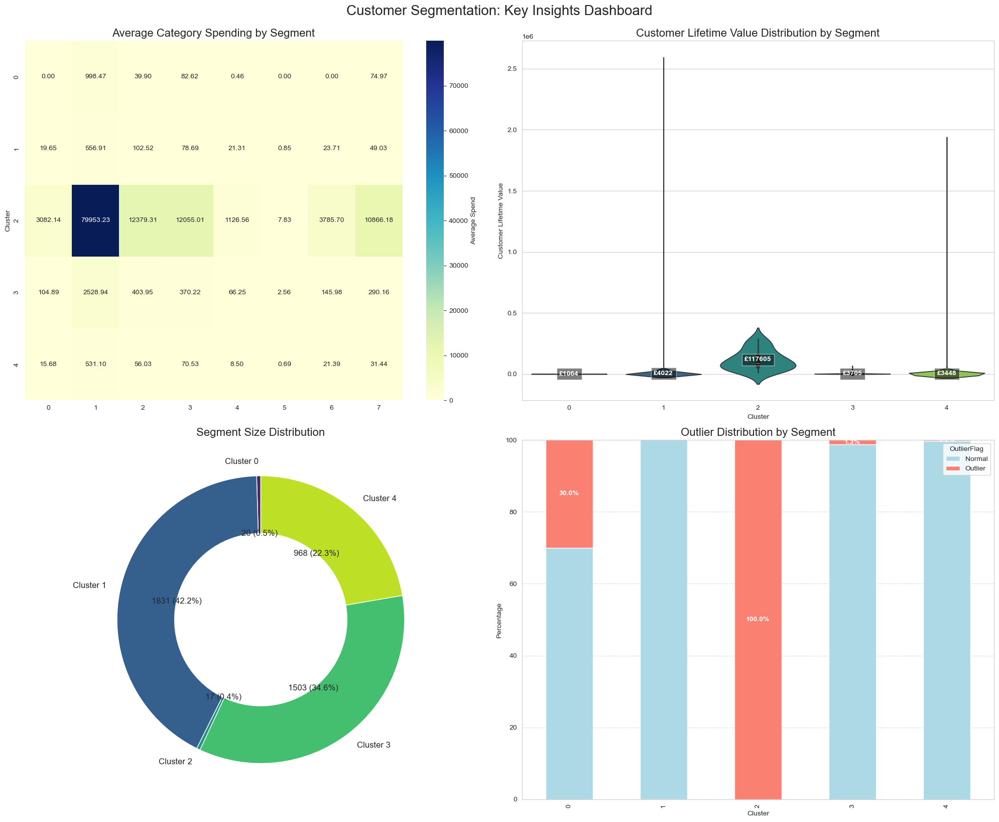


Category Spending by Cluster:


,CatSpend_0,CatSpend_1,CatSpend_2,CatSpend_3,CatSpend_4,CatSpend_5,CatSpend_6,CatSpend_7
Cluster,,,,,,,,
0,0.00,998.47,39.90,82.62,0.46,0.00,0.00,74.97
1,19.65,556.91,102.52,78.69,21.31,0.85,23.71,49.03
2,3082.14,79953.23,12379.31,12055.01,1126.56,7.83,3785.70,10866.18
3,104.89,2528.94,403.95,370.22,66.25,2.56,145.98,290.16
4,15.68,531.10,56.03,70.53,8.50,0.69,21.39,31.44



Cluster Sizes and CLV:


,Count,Percentage,Avg CLV
Cluster,,,
0,20,0.5,1064.02
1,1831,42.2,4021.52
2,17,0.4,117605.32
3,1503,34.6,3704.52
4,968,22.3,3447.77


In [55]:
def create_focused_dashboard(df):
    """Create focused dashboard showing category spending, CLV, segment sizes, and outliers"""
    # Set visualization theme
    sns.set_style("whitegrid")
    plt.rcParams['font.family'] = 'sans-serif'
    
    # Create figure with 2x2 subplots
    fig = plt.figure(figsize=(20, 16))
    
    # 1. Category Spending Heatmap by Cluster
    ax1 = plt.subplot2grid((2, 2), (0, 0))
    
    # Get all category spending columns
    cat_spend_cols = [col for col in df.columns if col.startswith('CatSpend_')]
    
    if len(cat_spend_cols) > 0:
        # Calculate mean category spending by cluster
        cat_spend_means = df.groupby('Cluster')[cat_spend_cols].mean()
        
        # Improve column names for display
        display_cols = [col.replace('CatSpend_', '') for col in cat_spend_cols]
        cat_spend_means.columns = display_cols
        
        # Create heatmap
        sns.heatmap(cat_spend_means, cmap='YlGnBu', annot=True, fmt='.2f', 
                   cbar_kws={'label': 'Average Spend'}, ax=ax1)
        ax1.set_title('Average Category Spending by Segment', fontsize=16)
        ax1.set_ylabel('Cluster')
    else:
        ax1.text(0.5, 0.5, "No Category Spending columns found", 
                 ha='center', va='center', fontsize=14)
    
    # 2. CLV Distribution by Cluster - Violin Plot
    ax2 = plt.subplot2grid((2, 2), (0, 1))
    if 'CLVEstimate' in df.columns:
        # Create violinplot for CLV by cluster
        sns.violinplot(x='Cluster', y='CLVEstimate', data=df, ax=ax2, palette='viridis')
        ax2.set_title('Customer Lifetime Value Distribution by Segment', fontsize=16)
        ax2.set_xlabel('Cluster')
        ax2.set_ylabel('Customer Lifetime Value')
        
        # Add mean CLV as text
        for i, (cluster, group) in enumerate(df.groupby('Cluster')):
            mean_clv = group['CLVEstimate'].mean()
            ax2.text(i, mean_clv, f'£{mean_clv:.0f}', ha='center', va='center',
                    fontweight='bold', color='white', bbox=dict(facecolor='black', alpha=0.5))
    
    # 3. Cluster Size Distribution - Donut Chart
    ax3 = plt.subplot2grid((2, 2), (1, 0))
    cluster_sizes = df['Cluster'].value_counts().sort_index()
    
    # Create donut chart
    wedges, texts, autotexts = ax3.pie(
        cluster_sizes, 
        labels=[f'Cluster {i}' for i in cluster_sizes.index],
        autopct='%1.1f%%', 
        startangle=90, 
        wedgeprops=dict(width=0.4),
        textprops={'fontsize': 12}, 
        colors=plt.cm.viridis(np.linspace(0.1, 0.9, len(cluster_sizes)))
    )
    
    # Add count to labels
    for i, autotext in enumerate(autotexts):
        autotext.set_text(f"{cluster_sizes.iloc[i]} ({autotext.get_text()})")
    
    ax3.set_title('Segment Size Distribution', fontsize=16)
    
    # 4. Outlier Distribution by Cluster
    ax4 = plt.subplot2grid((2, 2), (1, 1))
    if 'OutlierFlag' in df.columns:
        # Create a crosstab of clusters and outlier flags
        outlier_dist = pd.crosstab(
            df['Cluster'], 
            df['OutlierFlag'].map({1: 'Normal', -1: 'Outlier'})
        )
        
        # Convert to percentages
        outlier_pct = outlier_dist.div(outlier_dist.sum(axis=1), axis=0) * 100
        
        # Create stacked bar chart
        outlier_pct.plot(kind='bar', stacked=True, ax=ax4, 
                       color=['lightblue', 'salmon'])
        
        # Add percentage labels
        for i, (cluster, row) in enumerate(outlier_pct.iterrows()):
            if 'Outlier' in row:
                outlier_pct_val = row['Outlier']
                if outlier_pct_val > 0:
                    ax4.text(i, 100 - outlier_pct_val/2, 
                            f"{outlier_pct_val:.1f}%", 
                            ha='center', va='center', 
                            color='white', fontweight='bold')
        
        ax4.set_title('Outlier Distribution by Segment', fontsize=16)
        ax4.set_xlabel('Cluster')
        ax4.set_ylabel('Percentage')
        ax4.set_ylim(0, 100)
        ax4.grid(axis='y', linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.suptitle('Customer Segmentation: Key Insights Dashboard', fontsize=20, y=1.02)
    plt.show()
    
    # Print cluster summary statistics
    print("\nCategory Spending by Cluster:")
    if len(cat_spend_cols) > 0:
        cat_spend_summary = df.groupby('Cluster')[cat_spend_cols].mean().round(2)
        display(cat_spend_summary)
    
    print("\nCluster Sizes and CLV:")
    size_clv_summary = pd.DataFrame({
        'Count': cluster_sizes,
        'Percentage': (cluster_sizes / cluster_sizes.sum() * 100).round(1),
        'Avg CLV': df.groupby('Cluster')['CLVEstimate'].mean().round(2) if 'CLVEstimate' in df.columns else None
    })
    display(size_clv_summary)

# Run the visualization
create_focused_dashboard(df_customer_labeled)

In [56]:
# Filter only normal data points (OutlierFlag == 1)
df_normal_clusters = df_customer_labeled[df_customer_labeled['OutlierFlag'] == 1]

# df_customer_labeled is now clean and ready for supervised learning
print("Final shape after anomaly removal:", df_normal_clusters.shape)

Final shape after anomaly removal: (4295, 28)


In [57]:
# value counts of each cluster
df_normal_clusters['Cluster'].value_counts()

Cluster
1    1831
3    1484
4     966
0      14
Name: count, dtype: int64

We confirm here that Clusters 2 are anomalous which aligns with our intuition above based on the fact its CLV is 117605


### 4.5 Removal of outliers per cluster

C:\Users\acer\AppData\Local\Temp\ipykernel_102880\1770084198.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y='CLVEstimate', data=df, ax=ax2, palette='viridis')


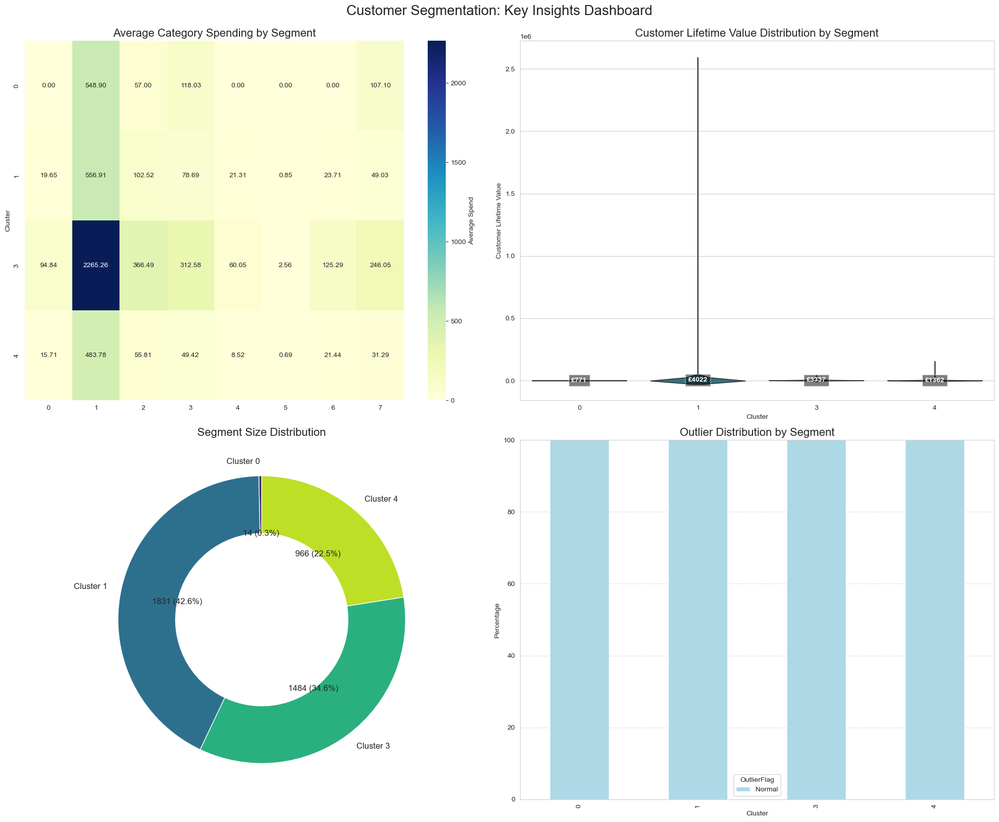


Category Spending by Cluster:


,CatSpend_0,CatSpend_1,CatSpend_2,CatSpend_3,CatSpend_4,CatSpend_5,CatSpend_6,CatSpend_7
Cluster,,,,,,,,
0,0.00,548.90,57.00,118.03,0.00,0.00,0.00,107.10
1,19.65,556.91,102.52,78.69,21.31,0.85,23.71,49.03
3,94.84,2265.26,366.49,312.58,60.05,2.56,125.29,246.05
4,15.71,483.78,55.81,49.42,8.52,0.69,21.44,31.29



Cluster Sizes and CLV:


,Count,Percentage,Avg CLV
Cluster,,,
0,14,0.3,770.55
1,1831,42.6,4021.52
3,1484,34.6,3336.98
4,966,22.5,1362.12


In [58]:
# Run the visualization
create_focused_dashboard(df_normal_clusters)

# 5. Model Implementation

## 5.1 Product Recommendations Based on Targeted Clusters

Use of customer_product_matrix defined earlier:

In [59]:
df_customer_category_matrix

,CustomerID,CatSpend_0,CatSpend_1,CatSpend_2,CatSpend_3,CatSpend_4,CatSpend_5,CatSpend_6,CatSpend_7
0,12346,0.00,77183.60,0.00,0.00,0.00,0.00,0.00,0.00
1,12347,80.40,3247.87,469.15,277.98,26.56,0.00,278.00,226.10
2,12348,41.76,1522.72,191.00,0.00,0.00,0.00,63.60,41.76
3,12349,17.85,1209.85,399.02,139.65,0.00,0.00,19.80,256.60
4,12350,40.20,271.10,0.00,0.00,0.00,0.00,17.70,20.40
...,...,...,...,...,...,...,...,...,...
4335,18281,0.00,79.92,33.90,0.00,0.00,0.00,0.00,0.00
4336,18282,0.00,171.91,6.64,0.00,0.00,0.00,13.00,0.00
4337,18283,40.68,1920.38,197.13,104.25,0.00,2.55,104.96,151.22
4338,18287,30.30,673.12,535.24,62.64,380.88,0.00,129.30,40.80


In [60]:
df_customer_product_matrix = pd.pivot_table(
    df_valid, 
    index='CustomerID', 
    columns='StockCode', 
    values='Quantity',  # or 'TotalSales'
    aggfunc='sum',
    fill_value=0
)

df_customer_product_matrix.head()

StockCode   10002  10080  10120  10123C  10124A  10124G  10125  10133  10135  \
CustomerID                                                                     
12346           0      0      0       0       0       0      0      0      0   
12347           0      0      0       0       0       0      0      0      0   
12348           0      0      0       0       0       0      0      0      0   
12349           0      0      0       0       0       0      0      0      0   
12350           0      0      0       0       0       0      0      0      0   

StockCode   11001  15030  15034  15036  15039  15044A  15044B  15044C  15044D  \
CustomerID                                                                      
12346           0      0      0      0      0       0       0       0       0   
12347           0      0      0      0      0       0       0       0       0   
12348           0      0      0      0      0       0       0       0       0   
12349           0      0      0      0      0       0       0       0       0   
12350           0      0      0      0      0       0       0       0       0   

StockCode   15056BL  15056N  15056P  15058A  15058B  15058C  15060B  16008  \
CustomerID                                                                   
12346             0       0       0       0       0       0       0      0   
12347             0       0       0       0       0       0       0     24   
12348             0       0       0       0       0       0       0      0   
12349             0       0       0       0       0       0       0      0   
12350             0       0       0       0       0       0       0      0   

StockCode   16010  16011  16012  16014  16015  16016  16020C  16033  16043  \
CustomerID                                                                   
12346           0      0      0      0      0      0       0      0      0   
12347           0      0      0      0      0      0       0      0      0   
12348           0      0      0      0      0      0       0      0      0   
12349           0      0      0      0      0      0       0      0      0   
12350           0      0      0      0      0      0       0      0      0   

StockCode   16045  16046  16048  16049  16052  16054  16151A  16156L  16156S  \
CustomerID                                                                     
12346           0      0      0      0      0      0       0       0       0   
12347           0      0      0      0      0      0       0       0       0   
12348           0      0      0      0      0      0       0       0       0   
12349           0      0      0      0      0      0       0       0       0   
12350           0      0      0      0      0      0       0       0       0   

StockCode   16161G  16161M  16161P  16161U  16162L  16162M  16168M  16169E  \
CustomerID                                                                   
12346            0       0       0       0       0       0       0       0   
12347            0       0       0       0       0       0       0       0   
12348            0       0       0       0       0       0       0       0   
12349            0       0       0       0       0       0       0       0   
12350            0       0       0       0       0       0       0       0   

StockCode   16169K  16169M  16169N  16169P  16202A  16202B  16202E  16206B  \
CustomerID                                                                   
12346            0       0       0       0       0       0       0       0   
12347            0       0       0       0       0       0       0       0   
12348            0       0       0       0       0       0       0       0   
12349            0       0       0       0       0       0       0       0   
12350            0       0       0       0       0       0       0       0   

StockCode   16207A  16207B  16216  16218  16219  16225  16235  16236  16237  \
CustomerID                                 

In [61]:
# revisit df_customer_labeled
df_customer_labeled.head()

,CustomerID,Recency,Frequency,TotalSpend,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,FavoriteProduct,FavoriteDescription,PurchaseIntervalAvg,AvgPurchaseValue,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate,Cluster,CatSpend_0,CatSpend_1,CatSpend_2,CatSpend_3,CatSpend_4,CatSpend_5,CatSpend_6,CatSpend_7,OutlierFlag
0,12346,326,1,77183.60,74215,2011-01-18,2011-01-18,1,1,United Kingdom,23166,MEDIUM CERAMIC TOP STORAGE JAR,0.000000,77183.600000,1,0.000000,0.000000,0.000000,4,0.00,77183.60,0.00,0.00,0.00,0.0,0.0,0.00,1
1,12347,3,7,4310.00,2458,2010-12-07,2011-12-07,103,7,Iceland,23076,ICE CREAM SUNDAE LIP GLOSS,2.016575,615.714286,366,0.016438,6.000000,3694.285714,3,80.40,3247.87,469.15,277.98,26.56,0.0,278.0,226.10,1
2,12348,76,4,1797.24,2341,2010-12-16,2011-09-25,22,4,Finland,23077,DOUGHNUT LIP GLOSS,9.433333,449.310000,284,0.010601,3.869258,1738.496290,3,41.76,1522.72,191.00,0.00,0.00,0.0,63.6,41.76,1
3,12349,19,1,1757.55,631,2011-11-21,2011-11-21,73,1,Italy,21231,SWEETHEART CERAMIC TRINKET BOX,0.000000,1757.550000,1,0.000000,0.000000,0.000000,1,17.85,1209.85,399.02,139.65,0.00,0.0,19.8,256.60,1
4,12350,311,1,334.40,197,2011-02-02,2011-02-02,17,1,Norway,22348,TEA BAG PLATE RED RETROSPOT,0.000000,334.400000,1,0.000000,0.000000,0.000000,4,40.20,271.10,0.00,0.00,0.00,0.0,17.7,20.40,1


In [62]:
# Convert quantity > 0 → 1 (binary basket)
df_basket = df_customer_product_matrix.applymap(lambda x: 1 if x > 0 else 0)

# Join Customer Cluster information to the basket
df_basket = df_basket.merge(df_customer_labeled[['CustomerID', 'Cluster']], on='CustomerID', how='inner')

# Drop CustomerID as apriori requires a matrix of binary values
df_basket = df_basket.set_index('CustomerID')  # Set index so we can drop it cleanly later

df_basket

C:\Users\acer\AppData\Local\Temp\ipykernel_102880\476687577.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_basket = df_customer_product_matrix.applymap(lambda x: 1 if x > 0 else 0)


10002  10080  10120  10123C  10124A  10124G  10125  10133  10135  \
CustomerID                                                                     
12346           0      0      0       0       0       0      0      0      0   
12347           0      0      0       0       0       0      0      0      0   
12348           0      0      0       0       0       0      0      0      0   
12349           0      0      0       0       0       0      0      0      0   
12350           0      0      0       0       0       0      0      0      0   
...           ...    ...    ...     ...     ...     ...    ...    ...    ...   
18280           0      0      0       0       0       0      0      0      0   
18281           0      0      0       0       0       0      0      0      0   
18282           0      0      0       0       0       0      0      0      0   
18283           0      0      0       0       0       0      0      0      0   
18287           0      0      0       0       0       0      0      0      0   

            11001  15030  15034  15036  15039  15044A  15044B  15044C  15044D  \
CustomerID                                                                      
12346           0      0      0      0      0       0       0       0       0   
12347           0      0      0      0      0       0       0       0       0   
12348           0      0      0      0      0       0       0       0       0   
12349           0      0      0      0      0       0       0       0       0   
12350           0      0      0      0      0       0       0       0       0   
...           ...    ...    ...    ...    ...     ...     ...     ...     ...   
18280           0      0      0      0      0       0       0       0       0   
18281           0      0      0      0      0       0       0       0       0   
18282           0      0      0      0      0       0       0       0       0   
18283           0      0      0      0      0       0       0       0       0   
18287           0      0      0      0      0       0       0       0       0   

            15056BL  15056N  15056P  15058A  15058B  15058C  15060B  16008  \
CustomerID                                                                   
12346             0       0       0       0       0       0       0      0   
12347             0       0       0       0       0       0       0      1   
12348             0       0       0       0       0       0       0      0   
12349             0       0       0       0       0       0       0      0   
12350             0       0       0       0       0       0       0      0   
...             ...     ...     ...     ...     ...     ...     ...    ...   
18280             0       0       0       0       0       0       0      0   
18281             0       0       0       0       0       0       0      0   
18282             0       0       0       0       0       0       0      0   
18283             0       0       0       0       0       0       0      0   
18287             0       0       0       0       0       0       0      0   

            16010  16011  16012  16014  16015  16016  16020C  16033  16043  \
CustomerID                                                                   
12346           0      0      0      0      0      0       0      0      0   
12347           0      0      0      0      0      0       0      0      0   
12348           0      0      0      0      0      0       0      0      0   
12349           0      0      0      0      0      0       0      0      0   
12350           0      0      0      0      0      0       0      0      0   
...           ...    ...    ...    ...    ...    ...     ...    ...    ...   
18280           0      0      0      0      0      0       0      0      0   
18281           0      0      0      0      0      0       0      0      0   
18282           0      0      0      0      0      0       0      0      0   
18283           0      0      0      0      

#### Applying the Apriori Algorithm for Association Rules in the Product Basket

In [63]:
df_basket['Cluster'].value_counts()

Cluster
1    1831
3    1503
4     968
0      20
2      17
Name: count, dtype: int64

In [64]:
# create a cluster_rule_dict to store the rules for each cluster
cluster_rules_dict = {}

For Cluster 0: we set max_len == 2 to get some recommendations as == 1 does not return any

In [65]:
from mlxtend.frequent_patterns import apriori, association_rules
import pickle

# Cluster 0 only
c = 0
cluster_basket = df_basket[df_basket['Cluster'] == c].drop(columns='Cluster')

# Filter infrequent items more aggressively for sparse clusters
item_counts = cluster_basket.sum(axis=0)
frequent_items_mask = item_counts[item_counts >= 1].index # frequent_items_mask helps to filter out infrequent items
cluster_basket = cluster_basket[frequent_items_mask]

if cluster_basket.shape[1] >= 2:
    frequent_items = apriori(cluster_basket, min_support=0.01, use_colnames=True, low_memory=True, max_len=2) # max_len=3 to limit itemset length
    if not frequent_items.empty:
        rules = association_rules(frequent_items, metric="lift", min_threshold=1.0)
        if not rules.empty:
            with open(f"rules_cluster_{c}.pkl", "wb") as f:
                pickle.dump(rules, f)

            cluster_rules_dict[c] = rules
            display(rules.sort_values(by='lift', ascending=False).head(5))
        else:
            print(" No rules found.")
    else:
        print(" No frequent itemsets.")
else:
    print(" Not enough frequent items.")


c:\Users\acer\anaconda3\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
36,(22634),(21754),0.05,0.05,0.05,1.0,20.0,1.0,0.0475,inf,1.0,1.0,1.0,1.0
49,(M),(22053),0.05,0.05,0.05,1.0,20.0,1.0,0.0475,inf,1.0,1.0,1.0,1.0
34,(22622),(21754),0.05,0.05,0.05,1.0,20.0,1.0,0.0475,inf,1.0,1.0,1.0,1.0
35,(21754),(22622),0.05,0.05,0.05,1.0,20.0,1.0,0.0475,inf,1.0,1.0,1.0,1.0
37,(21754),(22634),0.05,0.05,0.05,1.0,20.0,1.0,0.0475,inf,1.0,1.0,1.0,1.0


For Cluster 1: max_len is set as == 2 to get some recommendations as ==1 does not get any

In [66]:
# Cluster 1 only
c = 1
cluster_basket = df_basket[df_basket['Cluster'] == c].drop(columns='Cluster')

# Filter infrequent items more aggressively for sparse clusters
item_counts = cluster_basket.sum(axis=0)
frequent_items_mask = item_counts[item_counts >= 1].index
cluster_basket = cluster_basket[frequent_items_mask]

if cluster_basket.shape[1] >= 2:
    frequent_items = apriori(cluster_basket, min_support=0.01, use_colnames=True, low_memory=True, max_len=2)
    if not frequent_items.empty:
        rules = association_rules(frequent_items, metric="lift", min_threshold=1.0)
        if not rules.empty:
            with open(f"rules_cluster_{c}.pkl", "wb") as f:
                pickle.dump(rules, f)

            cluster_rules_dict[c] = rules
            display(rules.sort_values(by='lift', ascending=False).head(5))
        else:
            print(" No rules found.")
    else:
        print(" No frequent itemsets.")
else:
    print(" Not enough frequent items.")


c:\Users\acer\anaconda3\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
3331,(22916),(22921),0.013654,0.013108,0.013108,0.960000,73.240000,1.0,0.012929,24.672310,1.000000,0.960000,0.959469,0.980000
3330,(22921),(22916),0.013108,0.013654,0.013108,1.000000,73.240000,1.0,0.012929,inf,0.999447,0.960000,1.000000,0.980000
3344,(22921),(22918),0.013108,0.014200,0.013108,1.000000,70.423077,1.0,0.012921,inf,0.998893,0.923077,1.000000,0.961538
3345,(22918),(22921),0.014200,0.013108,0.013108,0.923077,70.423077,1.0,0.012921,12.829601,1.000000,0.923077,0.922055,0.961538
3323,(22916),(22917),0.013654,0.013654,0.013108,0.960000,70.310400,1.0,0.012921,24.658656,0.999423,0.923077,0.959446,0.960000


Cluster 2: max_len is set as == 2 to prevent missing clusters

In [67]:
# cluster 2 only
c = 2
cluster_basket = df_basket[df_basket['Cluster'] == c].drop(columns='Cluster')

# Filter infrequent items more aggressively for sparse clusters
item_counts = cluster_basket.sum(axis=0)
frequent_items_mask = item_counts[item_counts >= 5].index
cluster_basket = cluster_basket[frequent_items_mask]

if cluster_basket.shape[1] >= 2:
    frequent_items = apriori(cluster_basket, min_support=0.01, use_colnames=True, low_memory=True, max_len=2)
    if not frequent_items.empty:
        rules = association_rules(frequent_items, metric="lift", min_threshold=1.0)
        if not rules.empty:
            with open(f"rules_cluster_{c}.pkl", "wb") as f:
                pickle.dump(rules, f)
            
            cluster_rules_dict[c] = rules
            display(rules.sort_values(by='lift', ascending=False).head(5))
        else:
            print(" No rules found.")
    else:
        print(" No frequent itemsets.")
else:
    print(" Not enough frequent items.")


c:\Users\acer\anaconda3\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
807805,(22683),(22678),0.294118,0.294118,0.294118,1.0,3.4,1.0,0.207612,inf,1.0,1.0,1.0,1.0
369841,(21829),(23266),0.294118,0.294118,0.294118,1.0,3.4,1.0,0.207612,inf,1.0,1.0,1.0,1.0
251695,(35646),(21394),0.294118,0.294118,0.294118,1.0,3.4,1.0,0.207612,inf,1.0,1.0,1.0,1.0
251694,(21394),(35646),0.294118,0.294118,0.294118,1.0,3.4,1.0,0.207612,inf,1.0,1.0,1.0,1.0
767791,(85199S),(22604),0.294118,0.294118,0.294118,1.0,3.4,1.0,0.207612,inf,1.0,1.0,1.0,1.0


Cluster 3: Item counts found set > 20 and max_len of recommendations set at == 2 to prevent computational length

In [68]:
# Cluster 3 only
c = 3
cluster_basket = df_basket[df_basket['Cluster'] == c].drop(columns='Cluster')

# Filter infrequent items more aggressively for sparse clusters
item_counts = cluster_basket.sum(axis=0)
frequent_items_mask = item_counts[item_counts >= 20].index
cluster_basket = cluster_basket[frequent_items_mask]

if cluster_basket.shape[1] >= 2:
    frequent_items = apriori(cluster_basket, min_support=0.01, use_colnames=True, low_memory=True, max_len=2)
    if not frequent_items.empty:
        rules = association_rules(frequent_items, metric="lift", min_threshold=1.0)
        if not rules.empty:
            with open(f"rules_cluster_{c}.pkl", "wb") as f:
                pickle.dump(rules, f)
            
            cluster_rules_dict[c] = rules
            display(rules.sort_values(by='lift', ascending=False).head(5))
        else:
            print(" No rules found.")
    else:
        print(" No frequent itemsets.")
else:
    print(" Not enough frequent items.")


c:\Users\acer\anaconda3\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
329638,(23556),(23554),0.017299,0.017299,0.014637,0.846154,48.914201,1.0,0.014338,6.387558,0.996799,0.733333,0.843446,0.846154
329639,(23554),(23556),0.017299,0.017299,0.014637,0.846154,48.914201,1.0,0.014338,6.387558,0.996799,0.733333,0.843446,0.846154
334227,(82613B),(82613C),0.017964,0.015303,0.011976,0.666667,43.565217,1.0,0.011701,2.954092,0.994919,0.562500,0.661486,0.724638
334226,(82613C),(82613B),0.015303,0.017964,0.011976,0.782609,43.565217,1.0,0.011701,4.517365,0.992230,0.562500,0.778632,0.724638
330389,(35095B),(35095A),0.019295,0.015303,0.012641,0.655172,42.814093,1.0,0.012346,2.855622,0.995858,0.575758,0.649814,0.740630


Cluster 4: max_len set as == 2

In [69]:
# Cluster 4 only
c = 4
cluster_basket = df_basket[df_basket['Cluster'] == c].drop(columns='Cluster')

# Filter infrequent items more aggressively for sparse clusters
item_counts = cluster_basket.sum(axis=0)
frequent_items_mask = item_counts[item_counts >= 1].index
cluster_basket = cluster_basket[frequent_items_mask]

if cluster_basket.shape[1] >= 2:
    frequent_items = apriori(cluster_basket, min_support=0.01, use_colnames=True, low_memory=True, max_len=2)
    if not frequent_items.empty:
        rules = association_rules(frequent_items, metric="lift", min_threshold=1.0)
        if not rules.empty:
            with open(f"rules_cluster_{c}.pkl", "wb") as f:
                pickle.dump(rules, f)
            
            cluster_rules_dict[c] = rules
            display(rules.sort_values(by='lift', ascending=False).head(5))
        else:
            print(" No rules found.")
    else:
        print(" No frequent itemsets.")
else:
    print(" Not enough frequent items.")


c:\Users\acer\anaconda3\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
1333,(23171),(23172),0.013430,0.011364,0.010331,0.769231,67.692308,1.0,0.010178,4.284091,0.998639,0.714286,0.766578,0.839161
1332,(23172),(23171),0.011364,0.013430,0.010331,0.909091,67.692308,1.0,0.010178,10.852273,0.996552,0.714286,0.907853,0.839161
1238,(22917),(22916),0.015496,0.015496,0.015496,1.000000,64.533333,1.0,0.015256,inf,1.000000,1.000000,1.000000,1.000000
1239,(22916),(22917),0.015496,0.015496,0.015496,1.000000,64.533333,1.0,0.015256,inf,1.000000,1.000000,1.000000,1.000000
1363,(47599B),(47599A),0.013430,0.014463,0.012397,0.923077,63.824176,1.0,0.012202,12.811983,0.997731,0.800000,0.921948,0.890110


In [70]:
cluster_rules_dict

{0:    antecedents consequents  antecedent support  consequent support  support  \
 0      (15036)    (35001G)                0.10                0.05     0.05   
 1     (35001G)     (15036)                0.05                0.10     0.05   
 2      (40016)     (15036)                0.05                0.10     0.05   
 3      (15036)     (40016)                0.10                0.05     0.05   
 4      (72232)     (15036)                0.05                0.10     0.05   
 ..         ...         ...                 ...                 ...      ...   
 67    (35001G)     (40016)                0.05                0.05     0.05   
 68     (72232)    (35001G)                0.05                0.05     0.05   
 69    (35001G)     (72232)                0.05                0.05     0.05   
 70     (72232)     (40016)                0.05                0.05     0.05   
 71     (40016)     (72232)                0.05                0.05     0.05   
 
     confidence  lift  representati

## 5.2 Getting Actionable Insights for Business Recommendations

In [71]:
top_bundle_recommendations = {}

for cluster_id, rules in cluster_rules_dict.items():
    print(f"\n Recommendations for Cluster {cluster_id}")

    # Filter rules with high lift and confidence
    filtered_rules = rules[(rules['lift'] > 1.0) & (rules['confidence'] > 0.8)] 

    # Sort by lift and visualize top 5
    top_rules = filtered_rules.sort_values(by='lift', ascending=False)

    for idx, row in top_rules.iterrows():
        antecedents = tuple(row['antecedents'])
        consequents = tuple(row['consequents'])
        lift = row['lift']
        confidence = row['confidence']

        print(f" If customer buys {antecedents}, recommend {consequents} (Lift={lift:.2f}, Confidence={confidence:.2f})")

        # Optionally save to dictionary
        if cluster_id not in top_bundle_recommendations:
            top_bundle_recommendations[cluster_id] = []
        top_bundle_recommendations[cluster_id].append({
            'antecedents': antecedents,
            'consequents': consequents,
            'lift': lift,
            'confidence': confidence
        })



 Recommendations for Cluster 0
 If customer buys ('21754',), recommend ('22634',) (Lift=20.00, Confidence=1.00)
 If customer buys ('21754',), recommend ('22622',) (Lift=20.00, Confidence=1.00)
 If customer buys ('22622',), recommend ('21755',) (Lift=20.00, Confidence=1.00)
 If customer buys ('21755',), recommend ('22622',) (Lift=20.00, Confidence=1.00)
 If customer buys ('22634',), recommend ('21755',) (Lift=20.00, Confidence=1.00)
 If customer buys ('21755',), recommend ('22634',) (Lift=20.00, Confidence=1.00)
 If customer buys ('22655',), recommend ('21873',) (Lift=20.00, Confidence=1.00)
 If customer buys ('21873',), recommend ('22655',) (Lift=20.00, Confidence=1.00)
 If customer buys ('21873',), recommend ('23358',) (Lift=20.00, Confidence=1.00)
 If customer buys ('23358',), recommend ('21873',) (Lift=20.00, Confidence=1.00)
 If customer buys ('22053',), recommend ('M',) (Lift=20.00, Confidence=1.00)
 If customer buys ('M',), recommend ('22053',) (Lift=20.00, Confidence=1.00)
 If 

In [72]:
print(top_bundle_recommendations.keys())

dict_keys([0, 1, 2, 3, 4])


In [73]:
# split top_bundle_recommendations into dictionaries for each cluster:
top_bundle_recommendations_0 = top_bundle_recommendations[0]
top_bundle_recommendations_1 = top_bundle_recommendations[1]
top_bundle_recommendations_2 = top_bundle_recommendations[2]
top_bundle_recommendations_3 = top_bundle_recommendations[3]
top_bundle_recommendations_4 = top_bundle_recommendations[4]

### 5.2.1 Product Recommendations per cluster:

In [74]:
def build_recommendation_df(recommendations, product_descriptions):
    rows = []
    for rec in recommendations:
        antecedents = rec['antecedents']
        consequents = rec['consequents']
        lift = rec['lift']
        confidence = rec['confidence']

        antecedents_desc = product_descriptions[product_descriptions['StockCode'].isin(antecedents)]['Description'].tolist()
        consequents_desc = product_descriptions[product_descriptions['StockCode'].isin(consequents)]['Description'].tolist()

        rows.append({
            'antecedents': antecedents,
            'consequents': consequents,
            'lift': lift,
            'confidence': confidence,
            'antecedents_description': antecedents_desc,
            'consequents_description': consequents_desc
        })

    return pd.DataFrame(rows)

# Build recommendation DataFrames for each cluster
df0 = build_recommendation_df(top_bundle_recommendations_0, product_descriptions)
df1 = build_recommendation_df(top_bundle_recommendations_1, product_descriptions)
df2 = build_recommendation_df(top_bundle_recommendations_2, product_descriptions)
df3 = build_recommendation_df(top_bundle_recommendations_3, product_descriptions)
df4 = build_recommendation_df(top_bundle_recommendations_4, product_descriptions)

In [75]:
df0.head()

,antecedents,consequents,lift,confidence,antecedents_description,consequents_description
0,"(21754,)","(22634,)",20.0,1.0,[HOME BUILDING BLOCK WORD],[CHILDS BREAKFAST SET SPACEBOY ]
1,"(21754,)","(22622,)",20.0,1.0,[HOME BUILDING BLOCK WORD],[BOX OF VINTAGE ALPHABET BLOCKS]
2,"(22622,)","(21755,)",20.0,1.0,[BOX OF VINTAGE ALPHABET BLOCKS],[LOVE BUILDING BLOCK WORD]
3,"(21755,)","(22622,)",20.0,1.0,[LOVE BUILDING BLOCK WORD],[BOX OF VINTAGE ALPHABET BLOCKS]
4,"(22634,)","(21755,)",20.0,1.0,[CHILDS BREAKFAST SET SPACEBOY ],[LOVE BUILDING BLOCK WORD]


In [76]:
df1.head()

,antecedents,consequents,lift,confidence,antecedents_description,consequents_description
0,"(22916,)","(22921,)",73.240000,0.960000,[HERB MARKER THYME],[HERB MARKER CHIVES ]
1,"(22921,)","(22916,)",73.240000,1.000000,[HERB MARKER CHIVES ],[HERB MARKER THYME]
2,"(22918,)","(22921,)",70.423077,0.923077,[HERB MARKER PARSLEY],[HERB MARKER CHIVES ]
3,"(22921,)","(22918,)",70.423077,1.000000,[HERB MARKER CHIVES ],[HERB MARKER PARSLEY]
4,"(22917,)","(22916,)",70.310400,0.960000,[HERB MARKER ROSEMARY],[HERB MARKER THYME]


In [77]:
df2.head()

,antecedents,consequents,lift,confidence,antecedents_description,consequents_description
0,"(22396,)","(22745,)",3.4,1.0,[MAGNETS PACK OF 4 RETRO PHOTO],[POPPY'S PLAYHOUSE BEDROOM ]
1,"(85049G,)","(23091,)",3.4,1.0,[CHOCOLATE BOX RIBBONS ],"[ZINC HERB GARDEN CONTAINER, METAL HERB GERDEN..."
2,"(21809,)","(22581,)",3.4,1.0,[CHRISTMAS HANGING TREE WITH BELL],[WOOD STOCKING CHRISTMAS SCANDISPOT]
3,"(22581,)","(21809,)",3.4,1.0,[WOOD STOCKING CHRISTMAS SCANDISPOT],[CHRISTMAS HANGING TREE WITH BELL]
4,"(23263,)","(22376,)",3.4,1.0,[SET OF 3 WOODEN HEART DECORATIONS],[AIRLINE BAG VINTAGE JET SET WHITE]


In [78]:
df3.head()

,antecedents,consequents,lift,confidence,antecedents_description,consequents_description
0,"(23554,)","(23556,)",48.914201,0.846154,[LANDMARK FRAME OXFORD STREET],[LANDMARK FRAME COVENT GARDEN ]
1,"(23556,)","(23554,)",48.914201,0.846154,[LANDMARK FRAME COVENT GARDEN ],[LANDMARK FRAME OXFORD STREET]
2,"(35095A,)","(35095B,)",42.814093,0.826087,[BLUE VICTORIAN FABRIC OVAL BOX],[RED VICTORIAN FABRIC OVAL BOX]
3,"(22684,)","(22683,)",40.258929,0.964286,[FRENCH BLUE METAL DOOR SIGN 9],[FRENCH BLUE METAL DOOR SIGN 8]
4,"(22516,)","(22517,)",39.668622,0.818182,[CHILDS GARDEN RAKE BLUE],[CHILDS GARDEN RAKE PINK]


In [79]:
df4.head()

,antecedents,consequents,lift,confidence,antecedents_description,consequents_description
0,"(23172,)","(23171,)",67.692308,0.909091,[REGENCY TEA PLATE PINK],[REGENCY TEA PLATE GREEN ]
1,"(22916,)","(22917,)",64.533333,1.000000,[HERB MARKER THYME],[HERB MARKER ROSEMARY]
2,"(22917,)","(22916,)",64.533333,1.000000,[HERB MARKER ROSEMARY],[HERB MARKER THYME]
3,"(47599B,)","(47599A,)",63.824176,0.923077,[BLUE PARTY BAGS ],[PINK PARTY BAGS]
4,"(47599A,)","(47599B,)",63.824176,0.857143,[PINK PARTY BAGS],[BLUE PARTY BAGS ]


### 5.2.2 Category Recommendations per Cluster:

In [80]:
# how likely are the categories of the antecedents to be purchased together with the categories of the consequents
def build_category_recommendation_df(recommendations, product_descriptions):
    rows = []
    for rec in recommendations:
        antecedents = rec['antecedents']
        consequents = rec['consequents']
        lift = rec['lift']
        confidence = rec['confidence']

        antecedents_desc = product_descriptions[product_descriptions['StockCode'].isin(antecedents)]['Description'].tolist()
        consequents_desc = product_descriptions[product_descriptions['StockCode'].isin(consequents)]['Description'].tolist()

        antecedents_categories = product_descriptions[product_descriptions['StockCode'].isin(antecedents)]['ProductCategory'].tolist()
        consequents_categories = product_descriptions[product_descriptions['StockCode'].isin(consequents)]['ProductCategory'].tolist()

        rows.append({
            'antecedents': antecedents,
            'consequents': consequents,
            'lift': lift,
            'confidence': confidence,
            'antecedents_description': antecedents_desc,
            'consequents_description': consequents_desc,
            'antecedents_categories': antecedents_categories,
            'consequents_categories': consequents_categories
        })

    return pd.DataFrame(rows)

In [81]:
# Create 5 DataFrames
df0 = build_category_recommendation_df(top_bundle_recommendations_0, product_descriptions)
df1 = build_category_recommendation_df(top_bundle_recommendations_1, product_descriptions)
df2 = build_category_recommendation_df(top_bundle_recommendations_2, product_descriptions)
df3 = build_category_recommendation_df(top_bundle_recommendations_3, product_descriptions)
df4 = build_category_recommendation_df(top_bundle_recommendations_4, product_descriptions)

In [82]:
df0.head()

,antecedents,consequents,lift,confidence,antecedents_description,consequents_description,antecedents_categories,consequents_categories
0,"(21754,)","(22634,)",20.0,1.0,[HOME BUILDING BLOCK WORD],[CHILDS BREAKFAST SET SPACEBOY ],[1],[2]
1,"(21754,)","(22622,)",20.0,1.0,[HOME BUILDING BLOCK WORD],[BOX OF VINTAGE ALPHABET BLOCKS],[1],[1]
2,"(22622,)","(21755,)",20.0,1.0,[BOX OF VINTAGE ALPHABET BLOCKS],[LOVE BUILDING BLOCK WORD],[1],[1]
3,"(21755,)","(22622,)",20.0,1.0,[LOVE BUILDING BLOCK WORD],[BOX OF VINTAGE ALPHABET BLOCKS],[1],[1]
4,"(22634,)","(21755,)",20.0,1.0,[CHILDS BREAKFAST SET SPACEBOY ],[LOVE BUILDING BLOCK WORD],[2],[1]


In [83]:
df1.head()

,antecedents,consequents,lift,confidence,antecedents_description,consequents_description,antecedents_categories,consequents_categories
0,"(22916,)","(22921,)",73.240000,0.960000,[HERB MARKER THYME],[HERB MARKER CHIVES ],[1],[1]
1,"(22921,)","(22916,)",73.240000,1.000000,[HERB MARKER CHIVES ],[HERB MARKER THYME],[1],[1]
2,"(22918,)","(22921,)",70.423077,0.923077,[HERB MARKER PARSLEY],[HERB MARKER CHIVES ],[1],[1]
3,"(22921,)","(22918,)",70.423077,1.000000,[HERB MARKER CHIVES ],[HERB MARKER PARSLEY],[1],[1]
4,"(22917,)","(22916,)",70.310400,0.960000,[HERB MARKER ROSEMARY],[HERB MARKER THYME],[1],[1]


In [84]:
df2.head()

,antecedents,consequents,lift,confidence,antecedents_description,consequents_description,antecedents_categories,consequents_categories
0,"(22396,)","(22745,)",3.4,1.0,[MAGNETS PACK OF 4 RETRO PHOTO],[POPPY'S PLAYHOUSE BEDROOM ],[1],[1]
1,"(85049G,)","(23091,)",3.4,1.0,[CHOCOLATE BOX RIBBONS ],"[ZINC HERB GARDEN CONTAINER, METAL HERB GERDEN...",[1],"[1, 1]"
2,"(21809,)","(22581,)",3.4,1.0,[CHRISTMAS HANGING TREE WITH BELL],[WOOD STOCKING CHRISTMAS SCANDISPOT],[1],[1]
3,"(22581,)","(21809,)",3.4,1.0,[WOOD STOCKING CHRISTMAS SCANDISPOT],[CHRISTMAS HANGING TREE WITH BELL],[1],[1]
4,"(23263,)","(22376,)",3.4,1.0,[SET OF 3 WOODEN HEART DECORATIONS],[AIRLINE BAG VINTAGE JET SET WHITE],[2],[2]


In [85]:
df3.head()

,antecedents,consequents,lift,confidence,antecedents_description,consequents_description,antecedents_categories,consequents_categories
0,"(23554,)","(23556,)",48.914201,0.846154,[LANDMARK FRAME OXFORD STREET],[LANDMARK FRAME COVENT GARDEN ],[1],[1]
1,"(23556,)","(23554,)",48.914201,0.846154,[LANDMARK FRAME COVENT GARDEN ],[LANDMARK FRAME OXFORD STREET],[1],[1]
2,"(35095A,)","(35095B,)",42.814093,0.826087,[BLUE VICTORIAN FABRIC OVAL BOX],[RED VICTORIAN FABRIC OVAL BOX],[0],[1]
3,"(22684,)","(22683,)",40.258929,0.964286,[FRENCH BLUE METAL DOOR SIGN 9],[FRENCH BLUE METAL DOOR SIGN 8],[0],[0]
4,"(22516,)","(22517,)",39.668622,0.818182,[CHILDS GARDEN RAKE BLUE],[CHILDS GARDEN RAKE PINK],[0],[6]


In [86]:
df4.head()

,antecedents,consequents,lift,confidence,antecedents_description,consequents_description,antecedents_categories,consequents_categories
0,"(23172,)","(23171,)",67.692308,0.909091,[REGENCY TEA PLATE PINK],[REGENCY TEA PLATE GREEN ],[6],[1]
1,"(22916,)","(22917,)",64.533333,1.000000,[HERB MARKER THYME],[HERB MARKER ROSEMARY],[1],[1]
2,"(22917,)","(22916,)",64.533333,1.000000,[HERB MARKER ROSEMARY],[HERB MARKER THYME],[1],[1]
3,"(47599B,)","(47599A,)",63.824176,0.923077,[BLUE PARTY BAGS ],[PINK PARTY BAGS],[0],[6]
4,"(47599A,)","(47599B,)",63.824176,0.857143,[PINK PARTY BAGS],[BLUE PARTY BAGS ],[6],[0]


### 5.2.3 Recommendation Matrices for Visualization:

In [87]:
def calculate_category_recommendation_matrix(df):
    antecedent_categories = df['antecedents_categories']
    consequent_categories = df['consequents_categories']
    
    # First, flatten the categories if they're nested lists/tuples
    flat_antecedents = []
    flat_consequents = []
    
    for ant_cats, con_cats in zip(antecedent_categories, consequent_categories):
        for ant_cat in ant_cats:
            for con_cat in con_cats:
                flat_antecedents.append(ant_cat)
                flat_consequents.append(con_cat)
    
    # Find all unique categories to determine matrix dimensions
    all_categories = list(set(flat_antecedents) | set(flat_consequents))
    all_categories = sorted(all_categories)
    
    # Create empty matrix filled with zeros
    matrix_size = len(all_categories)
    recommendation_matrix = pd.DataFrame(
        np.zeros((matrix_size, matrix_size)),
        index=all_categories,
        columns=all_categories
    )
    
    # Count occurrences of each antecedent->consequent pair
    pair_counts = {}
    for ant, con in zip(flat_antecedents, flat_consequents):
        pair = (ant, con)
        pair_counts[pair] = pair_counts.get(pair, 0) + 1
    
    # Count total recommendations from each antecedent
    antecedent_totals = {}
    for ant in flat_antecedents:
        antecedent_totals[ant] = antecedent_totals.get(ant, 0) + 1

    # Calculate percentages and fill the matrix
    for (ant, con), count in pair_counts.items():
        percentage = (count / antecedent_totals[ant]) * 100
        recommendation_matrix.at[ant, con] = percentage
    
    
    return recommendation_matrix

In [88]:
# Calculate matrices for each cluster
recommendation_matrix_0 = calculate_category_recommendation_matrix(df0)
recommendation_matrix_1 = calculate_category_recommendation_matrix(df1)
recommendation_matrix_2 = calculate_category_recommendation_matrix(df2)
recommendation_matrix_3 = calculate_category_recommendation_matrix(df3)
recommendation_matrix_4 = calculate_category_recommendation_matrix(df4)


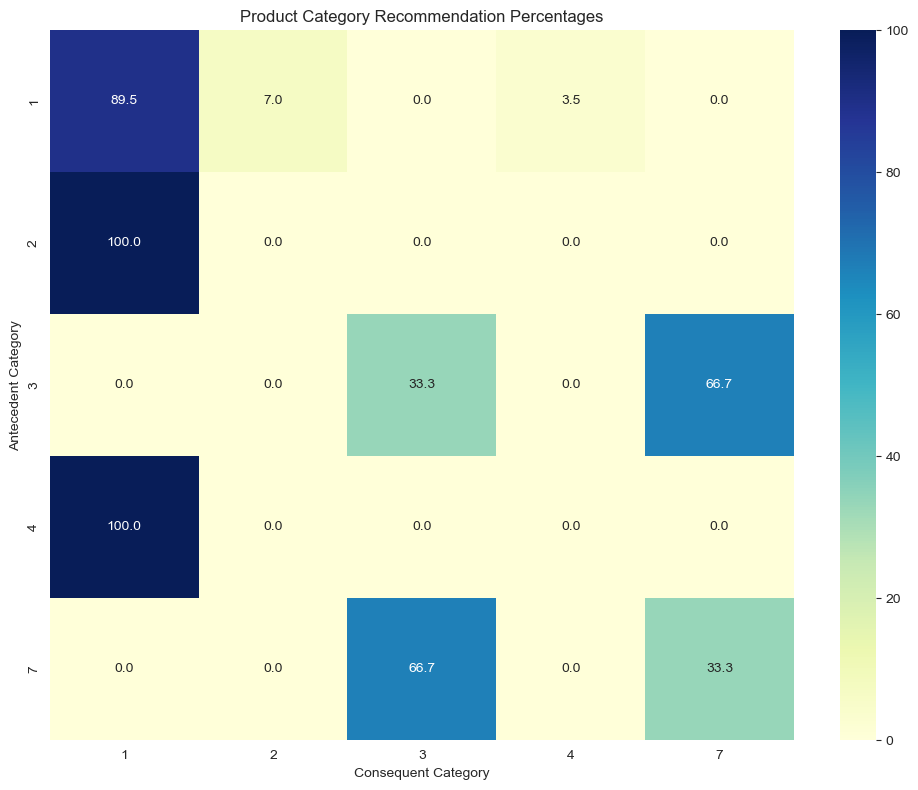

In [89]:
# Visualize for matrix 0
plt.figure(figsize=(10, 8))
sns.heatmap(recommendation_matrix_0, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Product Category Recommendation Percentages")
plt.ylabel("Antecedent Category")
plt.xlabel("Consequent Category")
plt.tight_layout()
plt.show()

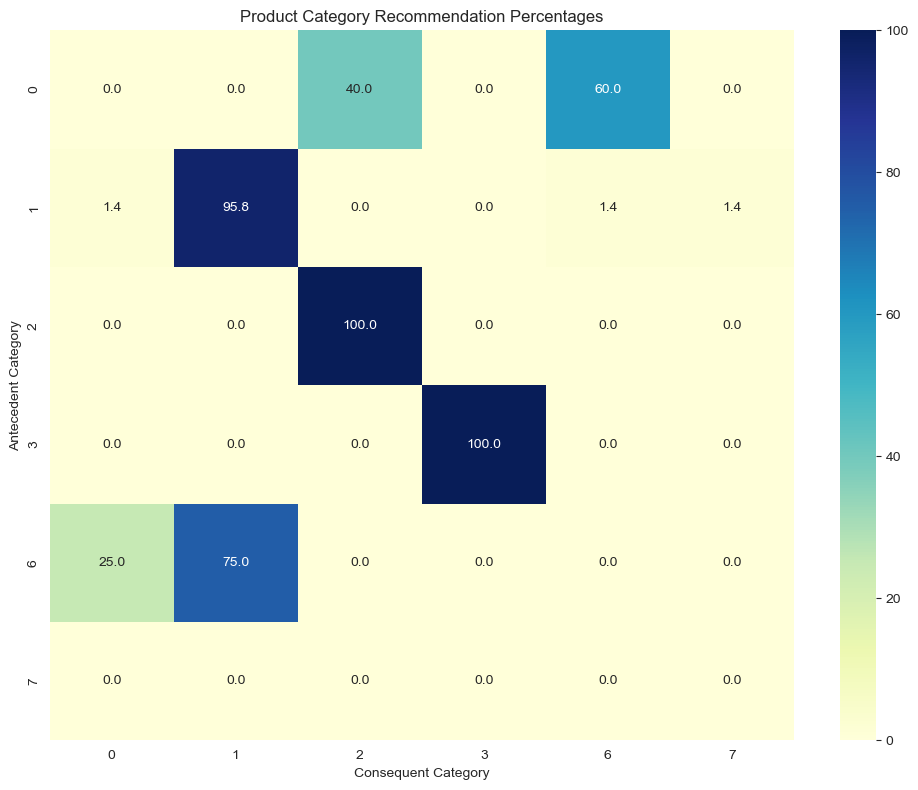

In [90]:
# visualize for matrix 1
plt.figure(figsize=(10, 8))
sns.heatmap(recommendation_matrix_1, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Product Category Recommendation Percentages")
plt.ylabel("Antecedent Category")
plt.xlabel("Consequent Category")
plt.tight_layout()
plt.show()

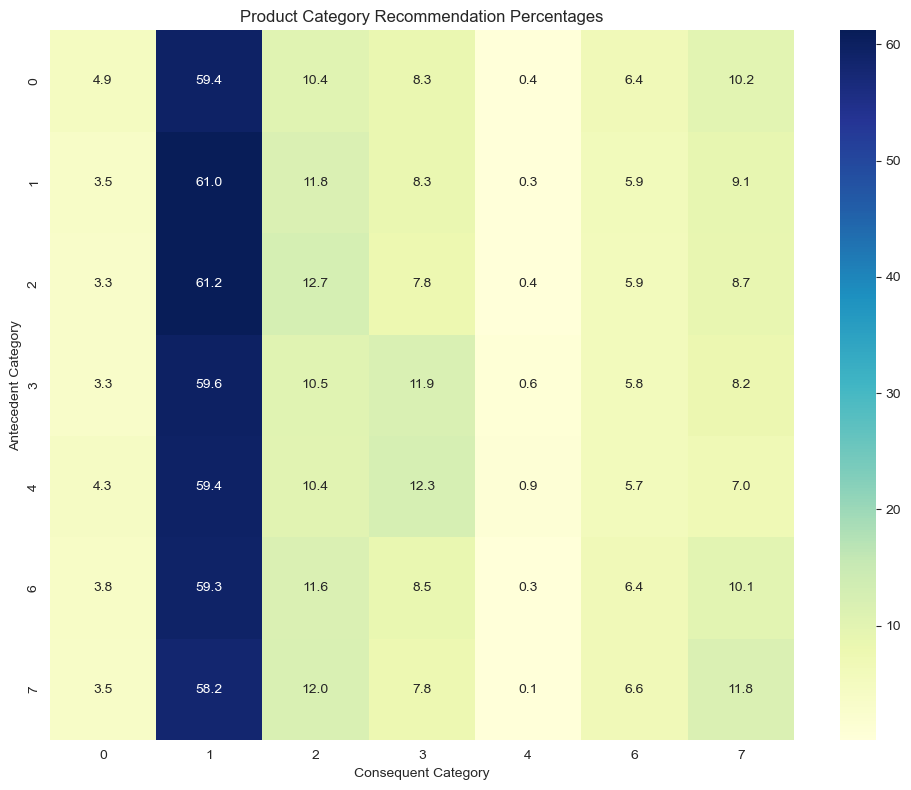

In [91]:
# visualize for matrix 2
plt.figure(figsize=(10, 8))
sns.heatmap(recommendation_matrix_2, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Product Category Recommendation Percentages")
plt.ylabel("Antecedent Category")
plt.xlabel("Consequent Category")
plt.tight_layout()
plt.show()

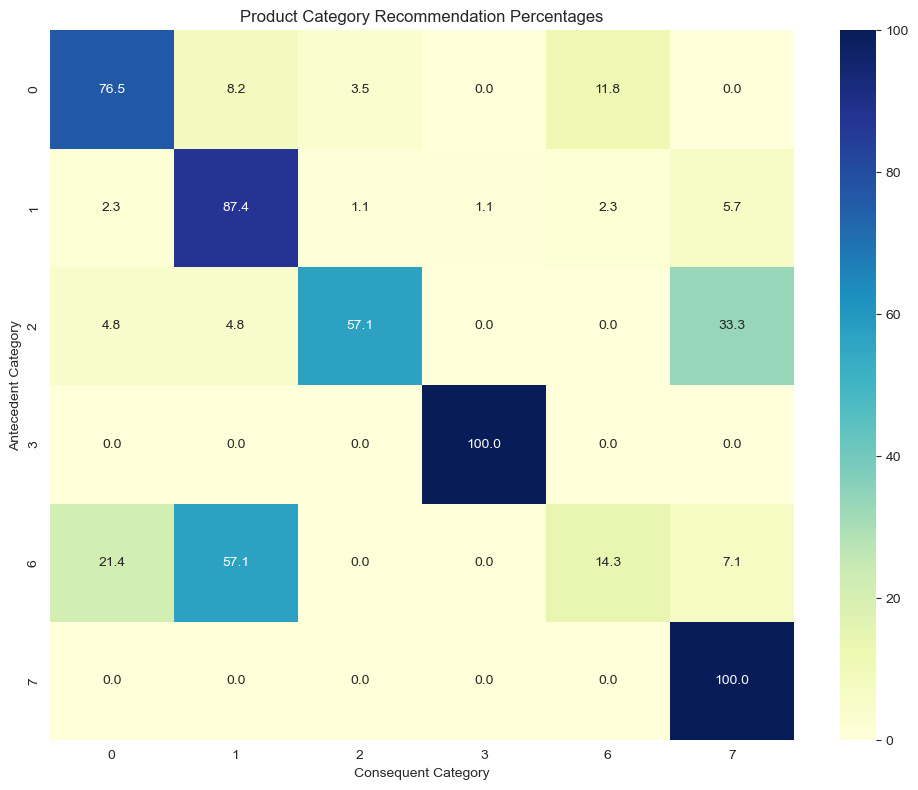

In [92]:
# visualize for matrix 3
plt.figure(figsize=(10, 8))
sns.heatmap(recommendation_matrix_3, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Product Category Recommendation Percentages")
plt.ylabel("Antecedent Category")
plt.xlabel("Consequent Category")
plt.tight_layout()
plt.show()

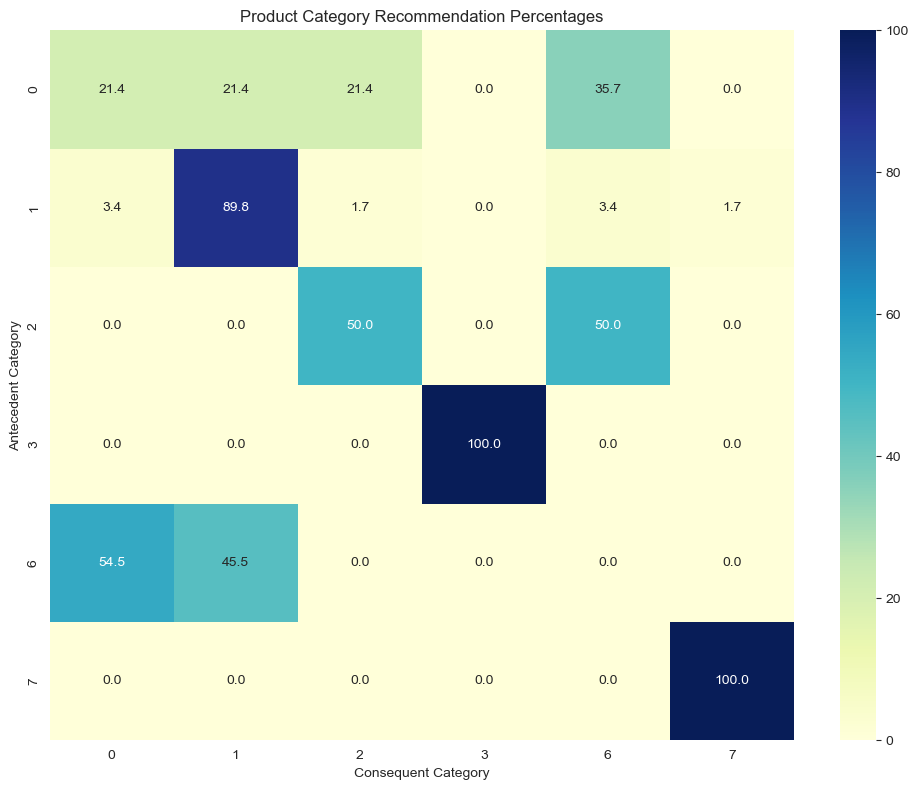

In [93]:
# visualize for matrix 4
plt.figure(figsize=(10, 8))
sns.heatmap(recommendation_matrix_4, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Product Category Recommendation Percentages")
plt.ylabel("Antecedent Category")
plt.xlabel("Consequent Category")
plt.tight_layout()
plt.show()

In [94]:
## Get customerIDs for each cluster
cluster_customer_ids = {}
for cluster in range(5):
    cluster_customer_ids[cluster] = df_customer_labeled[df_customer_labeled['Cluster'] == cluster]['CustomerID'].tolist()

# getting CustomerIds for cluster 2:
important_customer_ids = cluster_customer_ids[2]

In [95]:
# display df_customer_labeled for cluster 2
df_customer_labeled[df_customer_labeled['Cluster'] == 2]

,CustomerID,Recency,Frequency,TotalSpend,TotalQuantity,FirstPurchaseDate,LastPurchaseDate,UniqueProducts,NumberOfInvoices,Country,FavoriteProduct,FavoriteDescription,PurchaseIntervalAvg,AvgPurchaseValue,DaysActive,AvgPurchaseFrequency,PurchasesPerYear,CLVEstimate,Cluster,CatSpend_0,CatSpend_1,CatSpend_2,CatSpend_3,CatSpend_4,CatSpend_5,CatSpend_6,CatSpend_7,OutlierFlag
55,12415,25,21,124914.53,77670,2011-01-06,2011-11-15,444,21,Australia,22492,MINI PAINT SET VINTAGE,0.437762,5948.310952,314,0.063898,23.322684,138730.574928,2,3699.94,89895.54,32104.01,825.92,0.00,0.00,4986.07,20510.88,-1
326,12748,1,210,33719.73,25748,2010-12-01,2011-12-09,1768,210,United Kingdom,21135,VICTORIAN METAL POSTCARD SPRING,0.081175,160.570143,374,0.560322,204.517426,32839.392354,2,807.17,23291.95,3648.66,3914.91,2229.46,57.05,1081.99,2444.24,-1
562,13089,3,97,58825.83,31070,2010-12-05,2011-12-07,636,97,United Kingdom,84949,SILVER HANGING T-LIGHT HOLDER,0.201981,606.451856,368,0.261580,95.476839,57902.106329,2,953.00,44887.55,5180.86,10566.93,1762.44,0.00,1104.27,3146.99,-1
997,13694,4,50,65039.62,63312,2010-12-01,2011-12-06,366,50,United Kingdom,16216,LETTER SHAPE PENCIL SHARPENER,0.652557,1300.792400,371,0.132432,48.337838,62877.492092,2,1438.99,48104.88,3342.32,5275.02,712.80,4.56,4565.16,7982.70,-1
1290,14096,5,17,65164.79,16352,2011-08-30,2011-12-05,1119,17,United Kingdom,22419,LIPSTICK PEN RED,0.018982,3833.222941,98,0.164948,60.206186,230783.731716,2,1288.06,47265.36,8414.63,7089.80,2415.14,0.00,2384.14,2175.62,-1
1334,14156,10,55,117379.63,57885,2010-12-03,2011-11-30,714,55,EIRE,17084R,ASSORTED INCENSE PACK,0.258756,2134.175091,363,0.149171,54.447514,116200.527740,2,3125.99,87959.03,19622.13,11320.70,265.73,0.00,3015.88,14162.34,-1
1435,14298,9,44,51527.30,58343,2010-12-14,2011-12-01,884,44,United Kingdom,70006,LOVE HEART POCKET WARMER,0.215159,1171.075000,353,0.122159,44.588068,52215.971946,2,1385.51,31757.91,4010.47,10155.22,2405.76,54.72,3931.99,3166.96,-1
1662,14606,2,93,12156.65,6224,2010-12-01,2011-12-08,819,93,United Kingdom,22178,VICTORIAN GLASS HANGING T-LIGHT,0.137829,130.716667,373,0.247312,90.268817,11799.638889,2,353.73,7848.28,723.95,1400.66,531.60,7.65,629.23,1390.36,-1
1690,14646,2,74,280206.02,197491,2010-12-20,2011-12-08,701,74,Netherlands,23084,RABBIT NIGHT LIGHT,0.169793,3786.567838,354,0.206799,75.481586,285816.147420,2,9131.23,209123.15,53400.92,21063.80,915.60,0.00,13343.70,25691.93,-1
1880,14911,2,201,143825.06,80515,2010-12-01,2011-12-08,1787,201,EIRE,22952,60 CAKE CASES VINTAGE CHRISTMAS,0.065539,715.547562,373,0.537634,196.236559,140416.591505,2,3274.29,104834.36,22217.62,14742.09,2414.89,9.12,5771.09,8022.05,-1


## 5.3: Evaluation of Clusters according to Business Metrics:

In [96]:
# Analyze cluster characteristics
def analyze_clusters(df, clusters_to_analyze):
    results = {}
    
    # Check available clusters
    available_clusters = df['Cluster'].unique()
    print(f"Available clusters: {sorted(available_clusters)}")
    
    for cluster in clusters_to_analyze:
        if cluster not in available_clusters:
            print(f"Cluster {cluster} not found in data")
            continue
            
        cluster_data = df[df['Cluster'] == cluster]
        cluster_size = len(cluster_data) # Number of customers in cluster
        
        # Calculate summary statistics for numerical columns
        numeric_cols = cluster_data.select_dtypes(include=['int64', 'float64']).columns
        summary_stats = cluster_data[numeric_cols].describe().T[['mean', 'std', 'min', 'max']]
        
        results[f"Cluster {cluster}"] = {
            'size': cluster_size,
            'summary_stats': summary_stats,
            'sample': cluster_data.head(3)
        }
    
    return results

# Analyze specific clusters
clusters_of_interest = [0,1,2,3,4]  # Convert to a list
cluster_analysis = analyze_clusters(df_customer_labeled, clusters_of_interest)

# Display results
cluster_analysis


Available clusters: [0, 1, 2, 3, 4]


{'Cluster 0': {'size': 20,
  'summary_stats':                              mean          std        min          max
  Recency                 60.900000    56.832070    2.00000   177.000000
  Frequency                2.700000     0.801315    2.00000     4.000000
  TotalSpend            1137.341500  1617.886710   52.20000  6748.800000
  TotalQuantity         1526.550000  2363.777629   16.00000  8000.000000
  UniqueProducts           2.050000     1.234376    1.00000     5.000000
  NumberOfInvoices         2.700000     0.801315    2.00000     4.000000
  PurchaseIntervalAvg    126.017500    63.610819   66.60000   309.000000
  AvgPurchaseValue       432.232250   608.134308   26.10000  2249.600000
  DaysActive             250.050000    66.669235  127.00000   366.000000
  AvgPurchaseFrequency     0.007121     0.003248    0.00274     0.013393
  PurchasesPerYear         2.599145     1.185397    1.00000     4.888393
  CLVEstimate           1064.020129  1362.164585   26.10000  5115.912773
  CatSp

In [97]:
def visualize_cluster_comparison_with_size(df, clusters_to_compare, metrics):
    # Calculate number of subplots needed
    n_metrics = len(metrics)
    n_cols = 3  # 3 plots per row
    n_rows = (n_metrics + 1 + n_cols - 1) // n_cols  # +1 for cluster size plot, ceiling division
    
    # Create figure with appropriate size
    plt.figure(figsize=(18, 5 * n_rows))
    
    # Define color palettes for different plots
    color_palettes = [plt.cm.viridis, plt.cm.plasma, plt.cm.inferno, 
                      plt.cm.magma, plt.cm.cividis, plt.cm.cool, plt.cm.hot]
    
    # First, show cluster sizes - always in the first position
    plt.subplot(n_rows, n_cols, 1)
    cluster_sizes = []
    cluster_labels = []
    cluster_size_map = {}  # Store cluster sizes for later use
    
    for cluster in clusters_to_compare:
        if cluster in df['Cluster'].unique():
            size = len(df[df['Cluster'] == cluster])
            cluster_sizes.append(size)
            cluster_labels.append(f"Cluster {cluster}")
            cluster_size_map[cluster] = size  # Store for later calculations
    
    bars = plt.bar(cluster_labels, cluster_sizes, color=plt.cm.Blues(np.linspace(0.5, 0.9, len(cluster_labels))))
    plt.title("Number of Customers per Cluster")
    plt.ylabel("Count")
    
    # Add count labels on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}', ha='center', va='bottom')
    
    # Then show metrics with different calculation options
    for i, metric in enumerate(metrics, 1):
        if metric in df.columns:
            plt.subplot(n_rows, n_cols, i + 1)  # +1 because position 1 is for cluster size
            
            cluster_means = []
            
            for cluster in clusters_to_compare:
                if cluster in df['Cluster'].unique():
                    # Total metric sum for cluster divided by cluster size (same as mean)
                    total_metric = df[df['Cluster'] == cluster][metric].sum()
                    num_customers = cluster_size_map[cluster]
                    mean_val = total_metric / num_customers
                
                    cluster_means.append(mean_val)
            
            # Use a different color palette for each plot
            color_idx = i % len(color_palettes)
            color_palette = color_palettes[color_idx]
            colors = color_palette(np.linspace(0.5, 0.9, len(cluster_labels)))
            
            bars = plt.bar(cluster_labels, cluster_means, color=colors)
            plt.title(f"Average {metric} per Customer by Cluster")
            plt.ylabel(f"{metric}")
            plt.grid(axis='y', linestyle='--', alpha=0.7)
            
            # Add value labels on bars
            for bar in bars:
                height = bar.get_height()
                plt.text(bar.get_x() + bar.get_width()/2., height,
                        f'{height:.2f}', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()

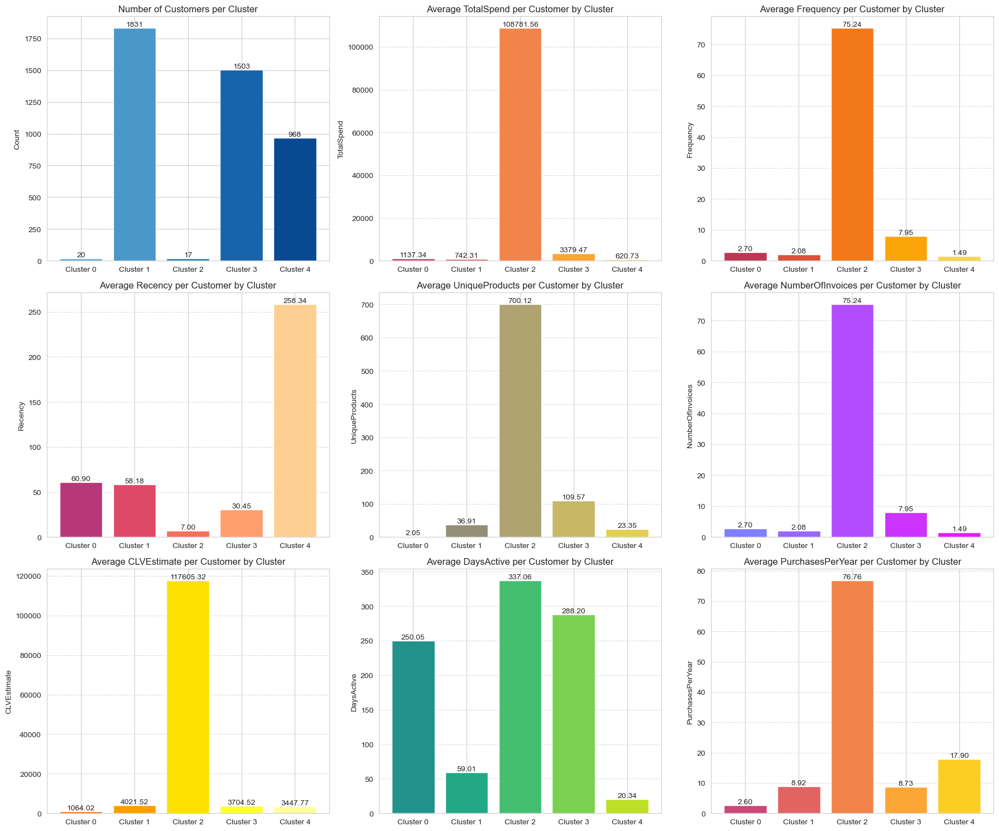

In [98]:
# Choose key metrics from your dataset for comparison
key_metrics = ['TotalSpend', 'Frequency', 'Recency', 'UniqueProducts', 'NumberOfInvoices', 'CLVEstimate', 'DaysActive', 'PurchasesPerYear']  # Adjust based on your actual columns
visualize_cluster_comparison_with_size(df_customer_labeled, clusters_of_interest, key_metrics)

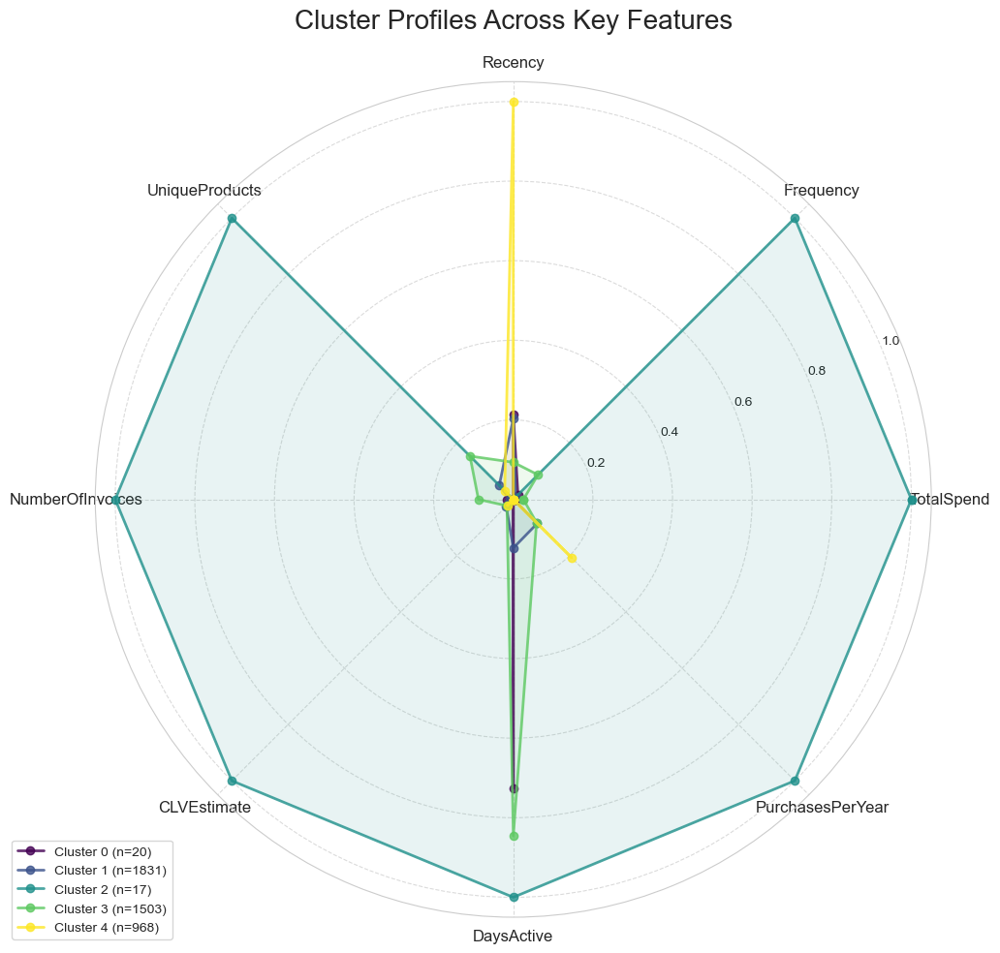

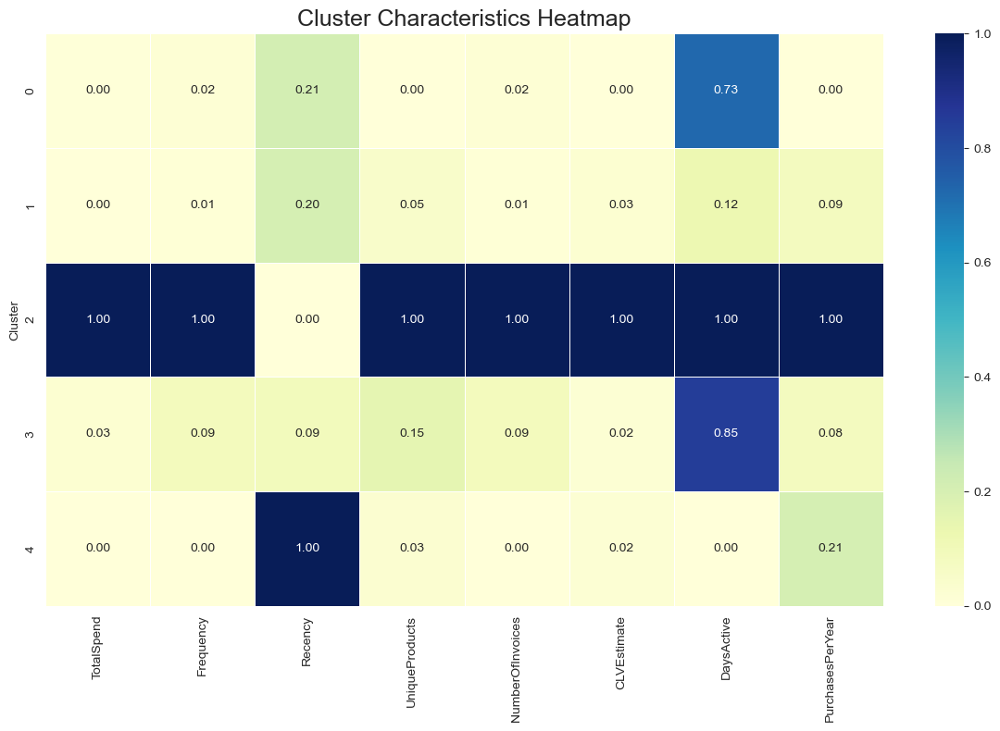

In [99]:
# visualize the cluster summary
def plot_cluster_radar(df, features_to_plot=None, normalize=True):
    """
    Create a radar chart to visualize cluster characteristics.
    
    Args:
        df: DataFrame with cluster labels
        features_to_plot: List of features to include in the visualization (default: use all in features_for_clustering)
        normalize: Whether to normalize values for better visualization
    """
    # If features not specified, use the ones from clustering
    if features_to_plot is None:
        features_to_plot = features_for_clustering
    
    # Calculate cluster summaries
    cluster_summary = df.groupby('Cluster')[features_to_plot].mean()
    
    # Normalize data if requested (helps with visualization when scales differ)
    if normalize:
        for feature in features_to_plot:
            max_val = cluster_summary[feature].max()
            min_val = cluster_summary[feature].min()
            if max_val > min_val:  # Avoid division by zero
                cluster_summary[feature] = (cluster_summary[feature] - min_val) / (max_val - min_val)
    
    # Get cluster sizes for reference
    cluster_sizes = df['Cluster'].value_counts().sort_index()
    
    # Radar chart setup
    n_features = len(features_to_plot)
    angles = np.linspace(0, 2*np.pi, n_features, endpoint=False).tolist()
    angles += angles[:1]  # Close the circle
    
    fig, ax = plt.subplots(figsize=(12, 10), subplot_kw=dict(polar=True))
    
    # Add feature labels
    plt.xticks(angles[:-1], features_to_plot, size=12)
    
    # Plot each cluster
    colors = plt.cm.viridis(np.linspace(0, 1, len(cluster_summary)))
    for i, (cluster_id, values) in enumerate(cluster_summary.iterrows()):
        values_list = values.values.tolist()
        values_list += values_list[:1]  # Close the loop
        
        # Plot the cluster line
        ax.plot(angles, values_list, 'o-', linewidth=2, 
                label=f'Cluster {cluster_id} (n={cluster_sizes[cluster_id]})', 
                color=colors[i], alpha=0.8)
        
        # Fill area
        ax.fill(angles, values_list, color=colors[i], alpha=0.1)
    
    # Customize the chart
    ax.set_title('Cluster Profiles Across Key Features', size=20, pad=20)
    ax.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    
    # Add gridlines
    ax.grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()
    
    # Also add a heatmap view of the same data for a different perspective
    plt.figure(figsize=(12, 8))
    sns.heatmap(cluster_summary, cmap="YlGnBu", annot=True, fmt=".2f", linewidths=.5)
    plt.title('Cluster Characteristics Heatmap', size=18)
    plt.tight_layout()
    plt.show()

# Run the visualization with key metrics
important_features = ['TotalSpend', 'Frequency', 'Recency', 'UniqueProducts', 'NumberOfInvoices', 'CLVEstimate', 'DaysActive', 'PurchasesPerYear']
plot_cluster_radar(df_customer_labeled, features_to_plot=important_features)

Identifying Cluster Similarities by CustomerID:

In [100]:
# Determine similarity between clusters
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform

def calculate_cluster_similarity(df, clusters_to_compare, features):
    # Get features that exist in the dataframe
    valid_features = [f for f in features if f in df.columns]
    
    # Calculate cluster centroids
    centroids = {}
    for cluster in clusters_to_compare:
        if cluster in df['Cluster'].unique():
            cluster_data = df[df['Cluster'] == cluster][valid_features]
            centroids[cluster] = cluster_data.mean().values.reshape(1, -1)
    
    # Calculate distances between centroids
    clusters = list(centroids.keys())
    centroid_values = np.vstack([centroids[c] for c in clusters])
    
    # Scale features for fair comparison
    scaler = StandardScaler()
    centroid_values_scaled = scaler.fit_transform(centroid_values)
    
    # Calculate pairwise distances
    distances = squareform(pdist(centroid_values_scaled))
    distance_df = pd.DataFrame(distances, index=clusters, columns=clusters)
    
    return distance_df

# Calculate similarity between clusters
features_for_comparison = ['Monetary', 'Frequency', 'Recency', 'TotalItems']  # Adjust based on your columns
cluster_similarity = calculate_cluster_similarity(df_customer_labeled, clusters_of_interest, features_for_comparison)


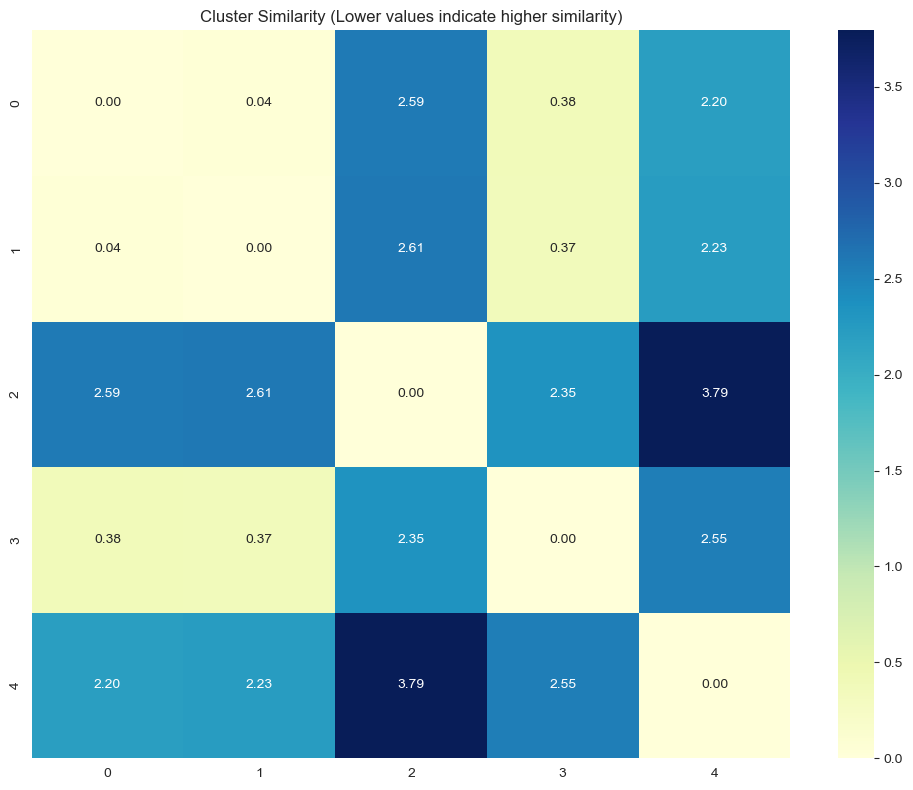

In [101]:
# Visualize similarity matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cluster_similarity, annot=True, cmap="YlGnBu", fmt=".2f")
plt.title("Cluster Similarity (Lower values indicate higher similarity)")
plt.tight_layout()
plt.show()

## Addendum Analysis for Slides Purposes

### Getting Specific Customers and Products in their Clusters

In [114]:
# Step 1: Display CustomerIDs by customer cluster

# First, let's create a function to sample CustomerIDs from each cluster
def display_customers_by_cluster(df, n_samples=17):
    """
    Display sample CustomerIDs from each customer cluster
    
    Args:
        df: DataFrame with Cluster labels and CustomerID
        n_samples: Number of customer samples to show per cluster (default: 10)
    """
    print("\n===== Sample Customers by Cluster =====")
    
    # Get unique clusters
    clusters = df['Cluster'].unique()
    
    # Create a DataFrame to store all CustomerIDs by cluster for potential export
    all_customerids_by_cluster = pd.DataFrame()
    
    # Loop through each cluster and display sample CustomerIDs
    for cluster in sorted(clusters):
        # Get cluster name if available
        cluster_name = "Unknown"
        if isinstance(cluster_analysis, dict) and 'Segment_Name' in cluster_analysis.get(cluster, {}):
            cluster_name = cluster_analysis[cluster]['Segment_Name']
        
        # Get customers from this cluster
        cluster_customers = df[df['Cluster'] == cluster]
        
        # Sample customers
        if len(cluster_customers) > n_samples:
            sampled_customers = cluster_customers.sample(n_samples, random_state=42)
        else:
            sampled_customers = cluster_customers
        
        # Store all customers for this cluster in the export DataFrame
        cluster_export_df = df[df['Cluster'] == cluster][['CustomerID']]
        cluster_export_df['Segment'] = cluster_name
        cluster_export_df['ClusterID'] = cluster
        all_customerids_by_cluster = pd.concat([all_customerids_by_cluster, cluster_export_df])
        
        # Display sample
        print(f"\nCluster {cluster} - {cluster_name} (Total: {len(cluster_customers)} customers)")
        print("Sample CustomerIDs:")
        display(sampled_customers[['CustomerID']].head(n_samples))
    
    # Return the complete DataFrame for potential export to CSV
    return all_customerids_by_cluster

# Run the function to display customers by cluster
all_customers_by_cluster = display_customers_by_cluster(df_customer_labeled)
all_customers_by_cluster.reset_index(drop=True, inplace=True)
all_customers_by_cluster

# Export all customers with their cluster information to CSV
all_customers_by_cluster.to_csv('customer_segments.csv', index=False)
print(f"\nFull customer segment assignments exported to 'customer_segments.csv'")


===== Sample Customers by Cluster =====

Cluster 0 - Unknown (Total: 20 customers)
Sample CustomerIDs:


,CustomerID
414,12875
4192,18087
4144,18017
435,12908
1930,14987
1598,14520
3072,16532
606,13145
4311,18246
4186,18080



Cluster 1 - Unknown (Total: 1831 customers)
Sample CustomerIDs:


,CustomerID
571,13099
3026,16468
3689,17397
2579,15850
2719,16052
879,13518
2809,16173
1856,14881
1507,14406
642,13194



Cluster 2 - Unknown (Total: 17 customers)
Sample CustomerIDs:


,CustomerID
55,12415
326,12748
562,13089
997,13694
1290,14096
1334,14156
1435,14298
1662,14606
1690,14646
1880,14911



Cluster 3 - Unknown (Total: 1503 customers)
Sample CustomerIDs:


,CustomerID
147,12530
4212,18116
550,13069
2913,16321
2115,15228
3006,16442
2677,15996
1154,13904
1698,14657
1672,14623



Cluster 4 - Unknown (Total: 968 customers)
Sample CustomerIDs:


,CustomerID
2620,15909
1182,13948
1786,14779
2234,15389
355,12791
4091,17946
3557,17212
2194,15333
408,12866
2485,15724



Full customer segment assignments exported to 'customer_segments.csv'


In [120]:
# Step 2: Display Products by Product Category Cluster

def display_products_by_category(df, n_samples=10):
    """
    Display product information by product category
    
    Args:
        df: Original transaction DataFrame
        n_samples: Number of product samples to show per category
    """
    print("\n===== Products by Category =====")
    
    required_cols = ['StockCode', 'Description']
    if not all(col in df.columns for col in required_cols):
        print("Error: Required columns 'StockCode' and 'Description' not found in the dataset")
        return None
    
    # Try to find a ProductCategory column if it exists
    if 'ProductCategory' in df.columns:
        # If ProductCategory already exists, use it
        product_cat_col = 'ProductCategory'
    
    # Get unique products with their categories
    if product_cat_col not in df.columns:
        # Merge the product categories back to the main dataframe if we created them
        df = df.merge(products_df[['StockCode', 'ProductCategory']], on='StockCode', how='left')

    # Get unique products
    unique_products = df[['StockCode', 'Description', product_cat_col]].drop_duplicates()
    
    # Create a DataFrame to store all products by category for potential export
    all_products_by_category = pd.DataFrame()
    
    # Get product counts per category
    product_counts_by_cat = unique_products[product_cat_col].value_counts()
    
    # Loop through each category and display sample products
    for category in sorted(unique_products[product_cat_col].unique()):
        # Get products from this category
        category_products = unique_products[unique_products[product_cat_col] == category]
        
        # Sample products
        if len(category_products) > n_samples:
            sampled_products = category_products.sample(n_samples, random_state=42)
        else:
            sampled_products = category_products
        
        # Store all products for this category in the export DataFrame
        all_products_by_category = pd.concat([all_products_by_category, category_products])
        
        # Display sample
        print(f"\n{category} (Total: {product_counts_by_cat[category]} products)")
        print("Sample Products:")
        display(sampled_products[['StockCode', 'Description']].head(n_samples))
    
    # Return the complete DataFrame for potential export to CSV
    return all_products_by_category


In [121]:
# Run the function to display products by category
all_products_by_category = display_products_by_category(df)
    
# Reset index for export
all_products_by_category.to_csv('product_categories.csv', index=False)
print(f"\nFull product category assignments exported to 'product_categories.csv'")



===== Products by Category =====

0 (Total: 236 products)
Sample Products:


,StockCode,Description
4282,22450,SILK PURSE BABUSHKA BLUE
116000,23051,RECYCLED ACAPULCO MAT BLUE
82968,17136A,BLUE STONES ON WIRE FOR CANDLE
476,21914,BLUE HARMONICA IN BOX
12484,22685,FRENCH BLUE METAL DOOR SIGN 0
9593,22684,FRENCH BLUE METAL DOOR SIGN 9
423115,23446,BLUE BUNNY EASTER EGG BASKET
7528,90152B,BLUE/GREEN SHELL NECKLACE W PENDANT
24961,15058A,BLUE POLKADOT GARDEN PARASOL
845,22925,BLUE GIANT GARDEN THERMOMETER



1 (Total: 2625 products)
Sample Products:


,StockCode,Description
655,22902,TOTE BAG I LOVE LONDON
85206,79062D,"RETRO TIN ASHTRAY,REVOLUTIONARY"
9701,22859,EASTER TIN BUNNY BOUQUET
1291,22164,STRING OF STARS CARD HOLDER
247115,23292,SPACEBOY CHILDRENS CUP
2605,90214M,"LETTER ""M"" BLING KEY RING"
340561,23433,HANGING QUILTED PATCHWORK APPLES
47,22544,MINI JIGSAW SPACEBOY
150,22646,CERAMIC STRAWBERRY CAKE MONEY BANK
2028,20840,FRENCH FLORAL CUSHION COVER



2 (Total: 381 products)
Sample Products:


,StockCode,Description
215574,23253,16 PC CUTLERY SET PANTRY DESIGN
24679,84951A,SET OF 4 PISTACHIO LOVEBIRD COASTER
921,85231B,CINAMMON SET OF 9 T-LIGHTS
1045,22643,SET OF 4 NAPKIN CHARMS LEAVES
1047,22604,SET OF 4 NAPKIN CHARMS CUTLERY
688,22909,SET OF 20 VINTAGE CHRISTMAS NAPKINS
11832,21253,SET OF PICTURE FRAME STICKERS
470560,23628,SET 10 CARDS TRIANGLE ICONS 17220
38800,20934,SET/3 POT PLANT CANDLES
1984,84988,SET OF 72 PINK HEART PAPER DOILIES



3 (Total: 277 products)
Sample Products:


,StockCode,Description
536,20669,RED HEART LUGGAGE TAG
10346,20985,HEART CALCULATOR
223140,85184C,SET 4 VALENTINE DECOUPAGE HEART BOX
19394,85118,HEART T-LIGHT HOLDER
363421,23074,EMBOSSED HEART TRINKET BOX
251609,23023,RIDGED BONNE JAM JAR T-LIGHT HOLDER
4075,20832,RED FLOCK LOVE HEART PHOTO FRAME
215106,23145,ZINC T-LIGHT HOLDER STARS LARGE
364662,23212,PAINTED HEART WREATH WITH BELL
20197,22647,CERAMIC LOVE HEART MONEY BANK



4 (Total: 180 products)
Sample Products:


,StockCode,Description
1879,72799E,IVORY PILLAR CANDLE SILVER FLOCK
4260,72127,COLUMBIAN CANDLE ROUND
208265,90081B,LILY BROOCH WHITE/SILVER COLOUR
10539,85036C,ROSE 1 WICK MORRIS BOXED CANDLE
150377,90014C,SILVER/BLACK ORBIT NECKLACE
1449,21688,SILVER PLATE CANDLE BOWL SMALL
1917,85039A,SET/4 RED MINI ROSE CANDLE IN BOWL
7713,85111,SILVER GLITTER FLOWER VOTIVE HOLDER
30773,84766,SILVER ROCOCO CANDLE STICK
36312,85103,SILVER T-LIGHT SETTING



5 (Total: 74 products)
Sample Products:


,StockCode,Description
1947,90099,NECKLACE+BRACELET SET BLUE HIBISCUS
57128,90038A,GLASS AND PAINTED BEADS BRACELET TO
7771,90010A,MIDNIGHT BLUE GLASS/SILVER BRACELET
854,90200B,BLACK SWEETHEART BRACELET
14877,90161D,ANT COPPER PINK BOUDICCA BRACELET
470753,90184c,BLACK CHUNKY BEAD BRACELET W STRAP
4324,90175C,BLUE GLASS CHUNKY CHARM BRACELET
17911,90198A,VINTAGE ROSE BEAD BRACELET RASPBERR
4426,90195B,BLACK GEMSTONE BRACELET
46804,90037B,TINY CRYSTAL BRACELET GREEN



6 (Total: 296 products)
Sample Products:


,StockCode,Description
217820,84746,PINK EASTER HENS+FLOWER
17875,85040A,S/4 PINK FLOWER CANDLES IN BOWL
4396,16156S,WRAP PINK FAIRY CAKES
4336,21465,PINK FLOWER CROCHET FOOD COVER
132494,84750A,PINK SMALL GLASS CAKE STAND
328,22064,PINK DOUGHNUT TRINKET POT
1857,35598D,PINK/WHITE CHRISTMAS TREE 60CM
239373,23285,PINK VINTAGE SPOT BEAKER
285988,90127A,PINK BEADS+HAND PHONE CHARM
5754,15056p,EDWARDIAN PARASOL PINK



7 (Total: 188 products)
Sample Products:


,StockCode,Description
447201,23485,BOTANICAL GARDENS WALL CLOCK
406736,23535,WALL ART BICYCLE SAFTEY
316,21980,PACK OF 12 RED RETROSPOT TISSUES
265,22180,RETROSPOT LAMP
2096,21372,MIRRORED WALL ART TABLE LAMP
19943,21749,LARGE RED RETROSPOT WINDMILL
1404,22667,RECIPE BOX RETROSPOT
3414,22507,MEMO BOARD RETROSPOT DESIGN
271,22632,HAND WARMER RED RETROSPOT
405864,23533,WALL ART GARDEN HAVEN



Full product category assignments exported to 'product_categories.csv'


### Enhanced Cluster Analysis:

In [119]:
# Step 1: Add more descriptive analysis of the clusters
print("\n===== Enhanced Cluster Analysis =====")

# Get a more comprehensive view of each cluster
cluster_analysis = df_customer_labeled.groupby('Cluster').agg({
    'TotalSpend': ['mean', 'median', 'std'],
    'Frequency': ['mean', 'median', 'std'],
    'Recency': ['mean', 'median', 'std'],
    'UniqueProducts': ['mean', 'median'],
    'NumberOfInvoices': ['mean', 'median'],
    'CLVEstimate': ['mean', 'median'],
    'DaysActive': ['mean']
}).round(2)

# Format the column names for better readability
cluster_analysis.columns = ['_'.join(col).strip() for col in cluster_analysis.columns.values]
display(cluster_analysis)

# Add customer count and percentage to the analysis
cluster_counts = df_customer_labeled['Cluster'].value_counts().sort_index()
cluster_analysis['Customer_Count'] = cluster_counts.values
cluster_analysis['Customer_Percentage'] = (cluster_counts.values / len(df_customer_labeled) * 100).round(2)

print("\nCustomer Distribution Across Clusters:")
display(cluster_analysis[['Customer_Count', 'Customer_Percentage']])


===== Enhanced Cluster Analysis =====


,TotalSpend_mean,TotalSpend_median,TotalSpend_std,Frequency_mean,Frequency_median,Frequency_std,Recency_mean,Recency_median,Recency_std,UniqueProducts_mean,UniqueProducts_median,NumberOfInvoices_mean,NumberOfInvoices_median,CLVEstimate_mean,CLVEstimate_median,DaysActive_mean
Cluster,,,,,,,,,,,,,,,,
0,1137.34,598.83,1617.89,2.70,2.5,0.80,60.90,39.0,56.83,2.05,2.0,2.70,2.5,1064.02,636.09,250.05
1,742.31,494.08,892.97,2.08,2.0,1.34,58.18,51.0,43.56,36.91,28.0,2.08,2.0,4021.52,458.64,59.01
2,108781.56,81024.84,77932.95,75.24,60.0,58.26,7.00,3.0,10.17,700.12,636.0,75.24,60.0,117605.32,86879.51,337.06
3,3379.47,1987.30,5198.03,7.95,6.0,7.10,30.45,22.0,30.23,109.57,88.0,7.95,6.0,3704.52,2157.62,288.20
4,620.73,304.25,3175.79,1.49,1.0,1.44,258.34,254.0,62.43,23.35,17.0,1.49,1.0,3447.77,0.00,20.34



Customer Distribution Across Clusters:


,Customer_Count,Customer_Percentage
Cluster,,
0,20,0.46
1,1831,42.20
2,17,0.39
3,1503,34.64
4,968,22.31


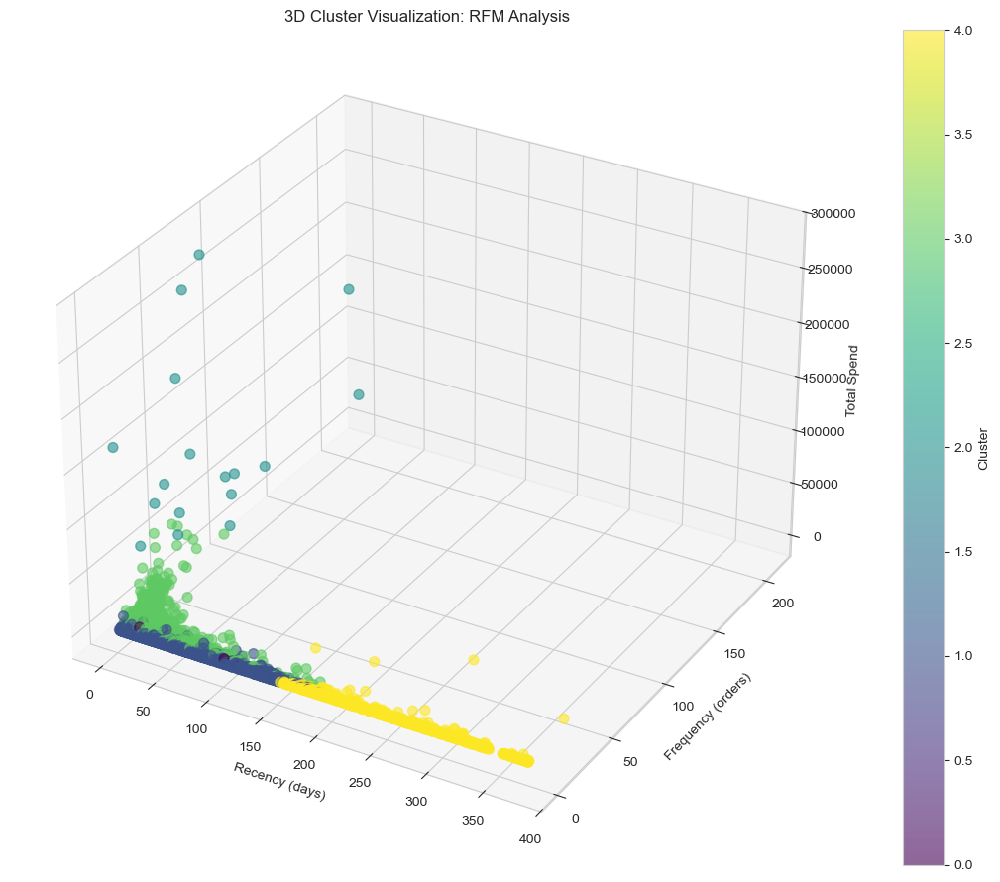

In [107]:
# Step 2: Create a 3D visualization of clusters using key RFM dimensions
try:
    fig = plt.figure(figsize=(12, 9))
    ax = fig.add_subplot(111, projection='3d')
    
    # Select a colormap
    cmap = plt.cm.viridis
    norm = plt.Normalize(df_customer_labeled['Cluster'].min(), df_customer_labeled['Cluster'].max())
    
    scatter = ax.scatter(
        df_customer_labeled['Recency'],
        df_customer_labeled['Frequency'],
        df_customer_labeled['TotalSpend'],
        c=df_customer_labeled['Cluster'],
        cmap=cmap,
        s=50,
        alpha=0.6
    )
    
    ax.set_xlabel('Recency (days)')
    ax.set_ylabel('Frequency (orders)')
    ax.set_zlabel('Total Spend')
    ax.set_title('3D Cluster Visualization: RFM Analysis')
    
    # Add a color bar
    cbar = plt.colorbar(scatter)
    cbar.set_label('Cluster')
    
    plt.tight_layout()
    plt.show()
except:
    print("3D visualization requires matplotlib with 3D support. Skipping this visualization.")


In [108]:
# Step 3: Segment Naming based on cluster characteristics
print("\n===== Customer Segment Naming and Profiling =====")

# Function to assign a segment name based on cluster characteristics
def assign_segment_name(cluster_id, cluster_data):
    # Get the row for this cluster
    row = cluster_data.loc[cluster_id]
    
    # Extract key metrics
    recency = row.get('Recency_mean', row.get('Recency_median', 0))
    frequency = row.get('Frequency_mean', row.get('Frequency_median', 0))
    spend = row.get('TotalSpend_mean', row.get('TotalSpend_median', 0))
    clv = row.get('CLVEstimate_mean', row.get('CLVEstimate_median', 0))
    
    # Calculate relative positions compared to other clusters
    recency_rank = cluster_data['Recency_mean'].rank(ascending=True)[cluster_id]  # Lower is better
    frequency_rank = cluster_data['Frequency_mean'].rank(ascending=False)[cluster_id]  # Higher is better
    spend_rank = cluster_data['TotalSpend_mean'].rank(ascending=False)[cluster_id]  # Higher is better
    
    # Number of clusters
    n_clusters = len(cluster_data)
    
    # Define segment based on characteristics
    if recency_rank <= n_clusters/3 and frequency_rank <= n_clusters/3 and spend_rank <= n_clusters/3:
        return "Champions", "High-value active customers who purchase frequently"
    
    elif recency_rank <= n_clusters/3 and frequency_rank <= n_clusters/2:
        return "Loyal Customers", "Regular shoppers with good purchasing frequency"
    
    elif recency_rank <= n_clusters/3 and spend_rank <= n_clusters/3:
        return "Big Spenders", "Recent customers who spend a lot but less frequently"
    
    elif recency_rank <= n_clusters/2 and frequency_rank > n_clusters/2:
        return "New Customers", "Recent customers still developing purchasing patterns"
    
    elif recency_rank > n_clusters*2/3 and frequency_rank <= n_clusters/3 and spend_rank <= n_clusters/2:
        return "At Risk", "Previously loyal customers who haven't purchased recently"
    
    elif recency_rank > n_clusters*2/3 and spend_rank <= n_clusters/3:
        return "Need Attention", "High-value customers who have become inactive"
    
    elif recency_rank > n_clusters*2/3 and frequency_rank > n_clusters*2/3 and spend_rank > n_clusters*2/3:
        return "Lost Customers", "Formerly active customers who haven't returned in a long time"
    
    elif frequency_rank > n_clusters*2/3 and spend_rank > n_clusters*2/3:
        return "Low-Value Customers", "Infrequent shoppers with low spending"
    
    else:
        return "Potential Loyalists", "Moderate shoppers with growth potential"

# Apply segment naming to each cluster
segment_info = {}
for cluster_id in cluster_analysis.index:
    segment_name, description = assign_segment_name(cluster_id, cluster_analysis)
    segment_info[cluster_id] = {
        'name': segment_name,
        'description': description
    }

# Add segment names to the cluster analysis
cluster_analysis['Segment_Name'] = [segment_info[i]['name'] for i in cluster_analysis.index]
cluster_analysis['Segment_Description'] = [segment_info[i]['description'] for i in cluster_analysis.index]

# Display the segments
print("\nCustomer Segments:")
for cluster_id, info in segment_info.items():
    print(f"Cluster {cluster_id}: {info['name']} - {info['description']}")



===== Customer Segment Naming and Profiling =====

Customer Segments:
Cluster 0: Potential Loyalists - Moderate shoppers with growth potential
Cluster 1: Low-Value Customers - Infrequent shoppers with low spending
Cluster 2: Champions - High-value active customers who purchase frequently
Cluster 3: Potential Loyalists - Moderate shoppers with growth potential
Cluster 4: Lost Customers - Formerly active customers who haven't returned in a long time


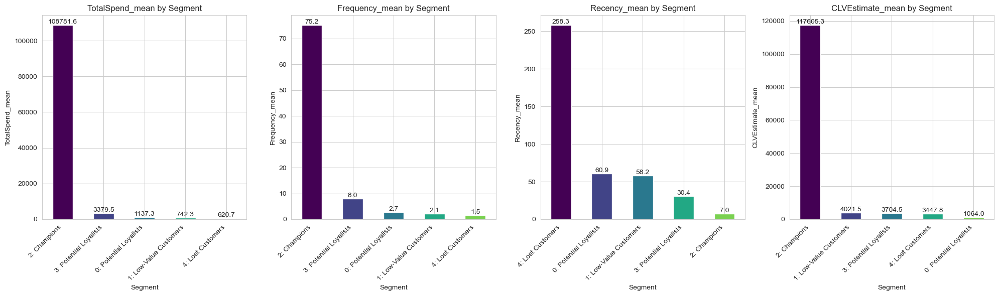

In [109]:
# Step 4: Visualize the segments with a bar chart showing key metrics by segment
def plot_segment_comparison(cluster_analysis, metrics):
    """
    Create bar charts comparing segments across key metrics
    
    Args:
        cluster_analysis: DataFrame with cluster statistics
        metrics: List of metrics to compare
    """
    num_metrics = len(metrics)
    fig, axes = plt.subplots(1, num_metrics, figsize=(num_metrics*5, 6))
    
    if num_metrics == 1:
        axes = [axes]  # Make it iterable if there's only one metric
    
    # Prepare the data
    plot_data = cluster_analysis.copy()
    plot_data['Segment'] = [f"{i}: {name}" for i, name in 
                           zip(plot_data.index, plot_data['Segment_Name'])]
    plot_data = plot_data.set_index('Segment')
    
    # Plot each metric
    for i, metric in enumerate(metrics):
        if metric in plot_data.columns:
            plot_data[metric].sort_values(ascending=False).plot(
                kind='bar', 
                ax=axes[i], 
                color=plt.cm.viridis(np.linspace(0, 0.8, len(plot_data)))
            )
            axes[i].set_title(f'{metric} by Segment')
            axes[i].set_ylabel(metric)
            
            # Add value labels on top of bars
            for j, v in enumerate(plot_data[metric].sort_values(ascending=False)):
                axes[i].text(j, v, f'{v:.1f}', ha='center', va='bottom')
                
            # Rotate x-axis labels for readability
            axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()

# Plot key metrics by segment
key_metrics = ['TotalSpend_mean', 'Frequency_mean', 'Recency_mean', 'CLVEstimate_mean']
plot_segment_comparison(cluster_analysis, key_metrics)
